## Does NBA Player Performance Affect Salary?

### Rishi Shah


### Explaining NBA Salaries

The NBA salary is one of the hardest, if not the hardest, sports salary cap to understand. This is due to their use of a soft cap compared to other sports and leagues using a hard cap. A hard cap is simple: the league establishes an amount of money each team can spend, and you cannot go over it. However, with a soft cap, teams are allowed to go over the cap. Teams are allowed to go over the cap to re-sign their own players; this is called the Bird Exception, named after the legendary Larry Bird. There are three types of bird rights: Non-Bird rights, Early bird rights, and full bird rights. For teams that go over the cap, they are forced to pay a luxury tax, which is then distributed to the teams that stayed under the cap for that season. For the avid NBA fan, they will understand the situation of the Golden State Warriors and how they were able to re-sign three prolific talents in Stephen Curry, Kevin Durant, and Klay Thompson. Furthermore, NBA teams are also required to spend a minimum amount of money, which is known as the salary floor. This is to ensure teams do not try to save money with a low-cost roster.

The NBA salary cap is also much more complicated than I have explained here due to the complexity of it. I will link to other resources and videos for more information about it.

Here is a video explaining the [NBA Salary Cap](https://www.youtube.com/watch?v=2pNeb9_QIB0)

### Purpose

The purpose of this tutorial is to explore the various factors in a player's performance that affect the salary they receive. This is important because it will allow teams to better understand how to allocate their money to players. This will also allow players to understand what they need to do to get paid more. This tutorial will also allow fans to understand why their favorite player is getting paid the amount they are getting paid. Data science is extremely useful for this as we can use the data to find the factors that affect salary the most. We are trying to understand which factors in a player's performance affect salary the most and which metrics are the most important. Player's also want to maximize their performance and earnings so it would be helpful for them to understand what aspects of their performance matters the most

## Data Collection and Imputation

The data I am using for this tutorial comes from [Basketball-Reference](https://www.basketball-reference.com/leagues/NBA_2022_totals.html). Basketball-Reference comes from [Stathead](https://stathead.com/), a well-known database that offers users valuable and insightful informtaion into various sports. Their statistics are updated daily. I am using the 2022 NBA season for this tutorial but any season can be used for this. I am using many advanced statistics as well as regular statistics to explorse different factors that affect salary.

In [1]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

import plotly.io as pio
pio.renderers.default = "notebook+plotly_mimetype+png+jpeg+svg+pdf"

# code to surpress warnings for HTML output

### Add the basic statistics data

In [2]:
# function that takes in url and return dataframe
import requests
from bs4 import BeautifulSoup
import pandas as pd

def get_data(url, table_name, drop_column):
    headers = { 'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) \
                AppleWebKit/537.36 (KHTML, like Gecko) Chrome/109.0.0.0 Safari/537.36 Edg/109.0.1518.78'}

    response = requests.get(url, headers=headers)
    soup = BeautifulSoup(response.text, 'html.parser')
    table = soup.find('table', {'id': table_name})
    # Find the tbody and extract all rows as a list
    tbody = table.find('tbody')
    rows = tbody.find_all('tr')
    # Extract the column names
    columns = []
    for th in table.find('thead').find_all('th'):
        if th.text != '':
            columns.append(th.text)

    # Extract the data for each row
    data = []
    for row in rows:
        row_data = []
        for td in row.find_all('td'):
            row_data.append(td.text)
        data.append(row_data)

    # Create a Pandas DataFrame from the data
    columns = columns[drop_column:]

    df = pd.DataFrame(data, columns=columns)
    return df


We created a function that takes in a URL and the number of columns to drop and it uses BeautifulSoup to scrape the data from the table. We then use pandas to store the dataframe and return it.

In [3]:
# Make a request to the website
url = 'https://www.basketball-reference.com/leagues/NBA_2023_per_minute.html'

basicstats_df = get_data(url, 'per_minute_stats', 1)


# Display the entire dataframe
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', None)
basicstats_df


,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,Precious Achiuwa,C,23,TOR,55,12,1140,6.2,12.8,.485,0.9,3.4,.269,5.3,9.3,.564,2.7,3.9,.702,3.2,7.2,10.4,1.6,1.0,0.9,1.9,3.2,16.0
1,Steven Adams,C,29,MEM,42,42,1133,5.0,8.4,.597,0.0,0.0,.000,5.0,8.3,.599,1.5,4.1,.364,6.8,8.6,15.4,3.1,1.1,1.5,2.5,3.1,11.5
2,Bam Adebayo,C,25,MIA,75,75,2598,8.3,15.4,.540,0.0,0.2,.083,8.3,15.3,.545,4.5,5.6,.806,2.5,7.0,9.5,3.3,1.2,0.8,2.6,2.9,21.2
3,Ochai Agbaji,SG,22,UTA,59,22,1209,4.9,11.5,.427,2.4,6.8,.355,2.5,4.7,.532,1.7,2.1,.812,1.3,2.3,3.6,2.0,0.5,0.4,1.2,2.9,13.9
4,Santi Aldama,PF,22,MEM,77,20,1682,5.3,11.2,.470,2.0,5.7,.353,3.3,5.5,.591,2.3,3.1,.750,1.8,6.1,7.9,2.1,1.0,1.0,1.3,3.1,14.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,Thaddeus Young,PF,34,TOR,54,9,795,4.9,9.0,.545,0.3,1.5,.176,4.6,7.4,.622,0.8,1.2,.692,3.2,4.3,7.5,3.4,2.4,0.2,1.9,4.0,10.9
701,Trae Young,PG,24,ATL,73,73,2541,8.5,19.7,.429,2.2,6.5,.335,6.3,13.2,.476,8.0,9.1,.886,0.8,2.3,3.1,10.5,1.1,0.1,4.3,1.5,27.1
702,Omer Yurtseven,C,24,MIA,9,0,83,6.9,11.7,.593,1.3,3.0,.429,5.6,8.7,.650,2.2,2.6,.833,3.5,6.5,10.0,0.9,0.9,0.9,1.7,6.9,17.3
703,Cody Zeller,C,30,MIA,15,2,217,6.1,9.8,.627,0.0,0.3,.000,6.1,9.5,.649,4.0,5.8,.686,4.1,6.5,10.6,1.7,0.5,0.7,2.3,5.5,16.3


Here, I simlpy display the information retrieved from basketball reference that we are going to use later in the tutorial.

### Data Collection

I collect the basic data from Basketball-Reference, stored inside a tbody with each row as a tr. I then drop the first column of rank and store this into a Pandas dataframe. Now, I need to drop rows that have values of none. Furthermore, some players played on multiple teams in the same season and I will make the player index value the same for these.

In [4]:
#drop rows that have none values
basicstats_df.dropna(subset=['Player'], inplace=True)

basicstats_df


,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,Precious Achiuwa,C,23,TOR,55,12,1140,6.2,12.8,.485,0.9,3.4,.269,5.3,9.3,.564,2.7,3.9,.702,3.2,7.2,10.4,1.6,1.0,0.9,1.9,3.2,16.0
1,Steven Adams,C,29,MEM,42,42,1133,5.0,8.4,.597,0.0,0.0,.000,5.0,8.3,.599,1.5,4.1,.364,6.8,8.6,15.4,3.1,1.1,1.5,2.5,3.1,11.5
2,Bam Adebayo,C,25,MIA,75,75,2598,8.3,15.4,.540,0.0,0.2,.083,8.3,15.3,.545,4.5,5.6,.806,2.5,7.0,9.5,3.3,1.2,0.8,2.6,2.9,21.2
3,Ochai Agbaji,SG,22,UTA,59,22,1209,4.9,11.5,.427,2.4,6.8,.355,2.5,4.7,.532,1.7,2.1,.812,1.3,2.3,3.6,2.0,0.5,0.4,1.2,2.9,13.9
4,Santi Aldama,PF,22,MEM,77,20,1682,5.3,11.2,.470,2.0,5.7,.353,3.3,5.5,.591,2.3,3.1,.750,1.8,6.1,7.9,2.1,1.0,1.0,1.3,3.1,14.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,Thaddeus Young,PF,34,TOR,54,9,795,4.9,9.0,.545,0.3,1.5,.176,4.6,7.4,.622,0.8,1.2,.692,3.2,4.3,7.5,3.4,2.4,0.2,1.9,4.0,10.9
701,Trae Young,PG,24,ATL,73,73,2541,8.5,19.7,.429,2.2,6.5,.335,6.3,13.2,.476,8.0,9.1,.886,0.8,2.3,3.1,10.5,1.1,0.1,4.3,1.5,27.1
702,Omer Yurtseven,C,24,MIA,9,0,83,6.9,11.7,.593,1.3,3.0,.429,5.6,8.7,.650,2.2,2.6,.833,3.5,6.5,10.0,0.9,0.9,0.9,1.7,6.9,17.3
703,Cody Zeller,C,30,MIA,15,2,217,6.1,9.8,.627,0.0,0.3,.000,6.1,9.5,.649,4.0,5.8,.686,4.1,6.5,10.6,1.7,0.5,0.7,2.3,5.5,16.3


### Cleaning the Data

Because some of the players were on multiple teams throughout the season, we need to figure out how to manage this data as the player appears multiple times in the data. To handle this, I have combined and averaged the relevant statistics to the player and inserted that data in the dataframe. We also need to get rid of duplicate rows if a player has played on multiple teams and keep just the one row of their total stats for the season.

We also convert the appropriate columns to numeric values so we can use them later.


In [5]:
# if a player appears multiple times, the team will be TOT. I want to keep the TOT row is they played multiple times and also keep players that only played for one team
# keep rows with unique player names and TOT in team column
df_grouped = basicstats_df[basicstats_df['Tm'].str.contains('TOT') | ~basicstats_df.duplicated(subset='Player', keep='first')]

cols_to_convert = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS']
df_grouped[cols_to_convert] = df_grouped[cols_to_convert].apply(pd.to_numeric)

df_grouped = df_grouped.sort_values(by=['PTS'], ascending=False)

df_grouped


,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
167,Tyler Dorsey,SG,26,DAL,3,0,8,18.0,22.5,0.800,4.5,9.0,0.500,13.5,13.5,1.000,0.0,0.0,NaN,4.5,4.5,9.0,0.0,0.0,0.0,0.0,0.0,40.5
637,Stanley Umude,SG,23,DET,1,0,2,0.0,18.0,0.000,0.0,18.0,0.000,0.0,0.0,NaN,36.0,36.0,1.000,0.0,0.0,0.0,0.0,18.0,18.0,0.0,0.0,36.0
678,Donovan Williams,SG,21,ATL,2,0,4,18.0,45.0,0.400,0.0,18.0,0.000,18.0,27.0,0.667,0.0,0.0,NaN,0.0,18.0,18.0,0.0,0.0,0.0,0.0,0.0,36.0
12,Giannis Antetokounmpo,PF,28,MIL,63,63,2024,12.6,22.7,0.553,0.8,3.0,0.275,11.7,19.7,0.596,8.9,13.7,0.645,2.4,10.8,13.2,6.4,0.9,0.9,4.4,3.5,34.8
191,Joel Embiid,C,28,PHI,66,66,2284,11.5,20.9,0.548,1.0,3.2,0.330,10.4,17.8,0.587,10.4,12.2,0.857,1.8,8.8,10.6,4.3,1.0,1.8,3.6,3.2,34.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
677,Alondes Williams,SG,23,BRK,1,0,5,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,7.2,7.2,0.0,0.0,0.0,14.4,7.2,0.0
309,Frank Jackson,PG,24,UTA,1,0,5,0.0,21.6,0.000,0.0,7.2,0.000,0.0,14.4,0.000,0.0,0.0,NaN,7.2,7.2,14.4,7.2,0.0,0.0,0.0,0.0,0.0
101,Deonte Burton,SG,29,SAC,2,0,6,0.0,12.0,0.000,0.0,6.0,0.000,0.0,6.0,0.000,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
203,Michael Foster Jr.,PF,20,PHI,1,0,1,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Here, I display the data after cleaning it and using the method described above to handle players on multiple teams.

### Add Advanced Statistics Data

Now that we have the basic statistics about the NBA players in a Pandas dataframe, we will add advanced statistics that will help guide our exploration of which factors affect salary the most. Some of the advanced statistics I will be using include PER and VORP. PER stands for Player Efficiency Rating created by John Hollinger and is supposed to be a all-in-one basketball rating for players. VORP stands for Value Over Replacement Player and is a box score estimate of the points per 100 TEAM possessions that a player contributed above a replacement-level (-2.0) player, translated to an average team and prorated to an 82-game season. I will be using the same method as before to collect the data and add it to the dataframe.

For more information about, PER visit [PER](https://www.youtube.com/watch?v=JsFRt_MNpDE)</br>
For more information about, VORP visit [VORP] (https://www.youtube.com/watch?v=jrun1poftGU)

Hollinger has only come up with many other statistics that use useful in decsribing a player's overall impact and contribution on the court. To learn more about this, visit [John Hollinger](http://www.espn.com/nba/hollinger/statistics)


In [6]:
# data collection
import requests
from bs4 import BeautifulSoup
import pandas as pd

url = 'https://www.basketball-reference.com/leagues/NBA_2023_advanced.html'
advancedstats_df = get_data(url, 'advanced_stats', 1)
advancedstats_df

,Player,Pos,Age,Tm,G,MP,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,OWS,DWS,WS,WS/48,,OBPM,DBPM,BPM,VORP
0,Precious Achiuwa,C,23,TOR,55,1140,15.2,.554,.267,.307,9.3,24.4,16.3,6.3,1.3,2.6,11.4,19.4,,0.8,1.4,2.2,.093,,-1.4,-0.8,-2.3,-0.1
1,Steven Adams,C,29,MEM,42,1133,17.5,.564,.004,.490,20.1,25.3,22.7,11.2,1.5,3.7,19.8,14.6,,1.3,2.1,3.4,.144,,-0.3,0.9,0.6,0.7
2,Bam Adebayo,C,25,MIA,75,2598,20.1,.592,.011,.361,8.0,23.6,15.5,15.9,1.7,2.4,12.7,25.2,,3.6,3.8,7.4,.137,,0.8,0.8,1.5,2.3
3,Ochai Agbaji,SG,22,UTA,59,1209,9.5,.561,.591,.179,3.9,6.9,5.4,7.5,0.6,1.0,9.0,15.8,,0.9,0.4,1.3,.053,,-1.7,-1.4,-3.0,-0.3
4,Santi Aldama,PF,22,MEM,77,1682,13.9,.591,.507,.274,5.4,18.0,11.7,7.6,1.3,2.6,9.3,16.0,,2.1,2.4,4.6,.130,,-0.3,0.8,0.5,1.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,Thaddeus Young,PF,34,TOR,54,795,14.1,.573,.172,.131,9.4,14.6,11.8,12.9,3.4,0.6,16.7,13.5,,0.7,1.1,1.8,.109,,-1.8,1.9,0.1,0.4
701,Trae Young,PG,24,ATL,73,2541,22.0,.573,.331,.460,2.4,7.0,4.7,42.5,1.5,0.3,15.2,32.6,,5.3,1.4,6.7,.126,,5.3,-2.0,3.3,3.4
702,Omer Yurtseven,C,24,MIA,9,83,16.7,.675,.259,.222,10.9,21.9,16.2,3.9,1.2,2.5,11.9,18.0,,0.2,0.1,0.3,.159,,-2.5,-1.5,-3.9,0.0
703,Cody Zeller,C,30,MIA,15,217,16.4,.659,.034,.593,13.0,21.8,17.3,7.2,0.7,1.9,15.8,18.1,,0.4,0.3,0.7,.147,,-2.0,-0.7,-2.8,0.0


Again, simply displaying the information given to us by Basketball-Reference.

### Data Collection

Once again, we need to combine the values for players being on multiple teams and then join the two dataframes together. We create a MPG column based on the minutes played and the games played. We then put the Player, Pos, Age, Tm, and G columns back to the front. We add in the MPG column right after the MP column

In [7]:
#drop rows that have none values
advancedstats_df.dropna(subset=['Player'], inplace=True)

# remove columnds that are not needed. The ones with ' '
df2 = advancedstats_df.loc[:, advancedstats_df.columns != ' ']

# convert the appropriate columns to numeric
df2['MP'] = df2['MP'].apply(pd.to_numeric)
df2['G'] = df2['G'].apply(pd.to_numeric)


df2['MPG'] = df2['MP']/df2['G']
#reorder the columns so MPG is after MP

cols = df2.columns.tolist()
cols = cols[:6] + cols[-1:] + cols[6:-1]
df2 = df2[cols]



df2

,Player,Pos,Age,Tm,G,MP,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,,OWS,DWS,WS,WS/48,,,OBPM,DBPM,BPM,VORP
0,Precious Achiuwa,C,23,TOR,55,1140,20.727273,15.2,.554,.267,.307,9.3,24.4,16.3,6.3,1.3,2.6,11.4,19.4,,,0.8,1.4,2.2,.093,,,-1.4,-0.8,-2.3,-0.1
1,Steven Adams,C,29,MEM,42,1133,26.976190,17.5,.564,.004,.490,20.1,25.3,22.7,11.2,1.5,3.7,19.8,14.6,,,1.3,2.1,3.4,.144,,,-0.3,0.9,0.6,0.7
2,Bam Adebayo,C,25,MIA,75,2598,34.640000,20.1,.592,.011,.361,8.0,23.6,15.5,15.9,1.7,2.4,12.7,25.2,,,3.6,3.8,7.4,.137,,,0.8,0.8,1.5,2.3
3,Ochai Agbaji,SG,22,UTA,59,1209,20.491525,9.5,.561,.591,.179,3.9,6.9,5.4,7.5,0.6,1.0,9.0,15.8,,,0.9,0.4,1.3,.053,,,-1.7,-1.4,-3.0,-0.3
4,Santi Aldama,PF,22,MEM,77,1682,21.844156,13.9,.591,.507,.274,5.4,18.0,11.7,7.6,1.3,2.6,9.3,16.0,,,2.1,2.4,4.6,.130,,,-0.3,0.8,0.5,1.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,Thaddeus Young,PF,34,TOR,54,795,14.722222,14.1,.573,.172,.131,9.4,14.6,11.8,12.9,3.4,0.6,16.7,13.5,,,0.7,1.1,1.8,.109,,,-1.8,1.9,0.1,0.4
701,Trae Young,PG,24,ATL,73,2541,34.808219,22.0,.573,.331,.460,2.4,7.0,4.7,42.5,1.5,0.3,15.2,32.6,,,5.3,1.4,6.7,.126,,,5.3,-2.0,3.3,3.4
702,Omer Yurtseven,C,24,MIA,9,83,9.222222,16.7,.675,.259,.222,10.9,21.9,16.2,3.9,1.2,2.5,11.9,18.0,,,0.2,0.1,0.3,.159,,,-2.5,-1.5,-3.9,0.0
703,Cody Zeller,C,30,MIA,15,217,14.466667,16.4,.659,.034,.593,13.0,21.8,17.3,7.2,0.7,1.9,15.8,18.1,,,0.4,0.3,0.7,.147,,,-2.0,-0.7,-2.8,0.0


### Cleaning the Data

Once again, due to players playing on multiple teams in the season, we need to handle this data. We manage like previously done and average the statistics and insert it in the dataframe. We also need to convert the column to numeric values to use later in the tutorial

Finally, we sort the dataframe by VORP value which is one of the most important statistics for ranking NBA players.

In [8]:
df2_grouped = df2[df2['Tm'].str.contains('TOT') | ~df2.duplicated(subset='Player', keep='first')]
advanced_cols_to_convert = ['Age', 'G', 'MP', 'PER', 'TS%', '3PAr', 'FTr', 'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%',
                            'USG%', 'OWS', 'DWS', 'WS', 'WS/48', 'OBPM', 'DBPM', 'BPM', 'VORP']

df2_grouped[advanced_cols_to_convert] = df2_grouped[advanced_cols_to_convert].apply(pd.to_numeric)

# sort the dataframe by points
df2_grouped = df2_grouped.sort_values(by=['VORP'], ascending=False)
df2_grouped


,Player,Pos,Age,Tm,G,MP,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,,OWS,DWS,WS,WS/48,,,OBPM,DBPM,BPM,VORP
330,Nikola Jokić,C,27,DEN,69,2323,33.666667,31.5,0.701,0.146,0.406,8.5,31.3,20.2,46.6,1.8,1.8,17.0,27.2,,,11.2,3.8,14.9,0.308,,,8.5,4.5,13.0,8.8
166,Luka Dončić,PG,23,DAL,66,2391,36.227273,28.7,0.609,0.373,0.479,2.6,25.4,13.8,42.3,1.9,1.2,11.9,37.6,,,7.3,2.9,10.2,0.204,,,7.6,1.4,9.0,6.6
191,Joel Embiid,C,28,PHI,66,2284,34.606061,31.4,0.655,0.151,0.581,5.9,28.3,17.3,22.9,1.4,4.6,11.9,37.0,,,8.4,3.9,12.3,0.259,,,6.8,2.3,9.2,6.4
103,Jimmy Butler,SF,33,MIA,64,2138,33.406250,27.6,0.647,0.116,0.625,7.5,13.3,10.3,27.1,2.7,1.0,8.2,25.6,,,9.4,2.9,12.3,0.277,,,6.7,2.0,8.7,5.8
217,Shai Gilgeous-Alexander,PG,24,OKC,68,2416,35.529412,27.2,0.626,0.122,0.535,2.6,12.2,7.3,25.7,2.2,2.5,10.1,32.8,,,8.4,3.0,11.4,0.226,,,5.8,1.5,7.3,5.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271,Killian Hayes,PG,21,DET,76,2154,28.342105,10.2,0.455,0.351,0.137,1.4,10.2,5.7,32.3,2.3,1.1,16.7,20.5,,,-1.9,1.4,-0.5,-0.012,,,-3.3,-0.5,-3.8,-1.0
85,Dillon Brooks,SF,27,MEM,73,2214,30.328767,9.4,0.494,0.443,0.155,2.2,9.5,5.8,11.7,1.4,0.7,8.9,21.8,,,-0.8,2.4,1.6,0.034,,,-3.4,-0.5,-3.9,-1.1
600,Jabari Smith Jr.,PF,19,HOU,79,2451,31.025316,11.2,0.514,0.438,0.231,5.4,20.3,12.7,5.9,0.9,3.0,9.6,18.4,,,0.5,1.4,1.9,0.037,,,-2.3,-1.3,-3.7,-1.1
76,Malaki Branham,SF,19,SAS,66,1550,23.484848,9.5,0.524,0.417,0.115,1.9,11.2,6.4,11.4,1.0,0.4,10.6,19.1,,,-0.4,0.2,-0.1,-0.004,,,-3.0,-2.1,-5.2,-1.2


At this step, we have handled the case for players being on multiple teams by averaging the data.

### Combine the Dataframes

Now that we have the basic statistive and advanced statistics, we want to combine both dataframes together. We can achieve this by joining on the Player name. We use an inner join which will keep the players that appear in both dataframes.

There are different types of joins that have different use cases.

For more information about `join` visit [Join](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.join.html)

In [9]:
# combine the two dataframes
df_combined = pd.merge(df_grouped, df2_grouped, on='Player', how='inner')
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', None)
df_combined

,Player,Pos_x,Age_x,Tm_x,G_x,GS,MP_x,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Pos_y,Age_y,Tm_y,G_y,MP_y,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,,OWS,DWS,WS,WS/48,,,OBPM,DBPM,BPM,VORP
0,Tyler Dorsey,SG,26,DAL,3,0,8,18.0,22.5,0.800,4.5,9.0,0.500,13.5,13.5,1.000,0.0,0.0,NaN,4.5,4.5,9.0,0.0,0.0,0.0,0.0,0.0,40.5,SG,26,DAL,3,8,2.666667,45.5,0.900,0.400,0.000,14.4,14.7,14.5,0.0,0.0,0.0,0.0,28.3,,,0.1,0.0,0.1,0.367,,,16.5,1.6,18.0,0.0
1,Stanley Umude,SG,23,DET,1,0,2,0.0,18.0,0.000,0.0,18.0,0.000,0.0,0.0,NaN,36.0,36.0,1.000,0.0,0.0,0.0,0.0,18.0,18.0,0.0,0.0,36.0,SG,23,DET,1,2,2.000000,65.6,0.532,1.000,2.000,0.0,0.0,0.0,0.0,24.2,44.1,0.0,40.0,,,0.0,0.0,0.0,0.626,,,15.9,32.7,48.6,0.0
2,Donovan Williams,SG,21,ATL,2,0,4,18.0,45.0,0.400,0.0,18.0,0.000,18.0,27.0,0.667,0.0,0.0,NaN,0.0,18.0,18.0,0.0,0.0,0.0,0.0,0.0,36.0,SG,21,ATL,2,4,2.000000,14.5,0.400,0.400,0.000,0.0,55.4,27.4,0.0,0.0,0.0,0.0,52.5,,,0.0,0.0,0.0,-0.225,,,-9.1,-6.1,-15.2,0.0
3,Giannis Antetokounmpo,PF,28,MIL,63,63,2024,12.6,22.7,0.553,0.8,3.0,0.275,11.7,19.7,0.596,8.9,13.7,0.645,2.4,10.8,13.2,6.4,0.9,0.9,4.4,3.5,34.8,PF,28,MIL,63,2024,32.126984,29.0,0.605,0.134,0.604,7.3,30.0,19.1,33.2,1.2,2.1,13.2,38.8,,,4.9,3.7,8.6,0.204,,,5.8,2.7,8.5,5.4
4,Joel Embiid,C,28,PHI,66,66,2284,11.5,20.9,0.548,1.0,3.2,0.330,10.4,17.8,0.587,10.4,12.2,0.857,1.8,8.8,10.6,4.3,1.0,1.8,3.6,3.2,34.4,C,28,PHI,66,2284,34.606061,31.4,0.655,0.151,0.581,5.9,28.3,17.3,22.9,1.4,4.6,11.9,37.0,,,8.4,3.9,12.3,0.259,,,6.8,2.3,9.2,6.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
534,Alondes Williams,SG,23,BRK,1,0,5,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,7.2,7.2,0.0,0.0,0.0,14.4,7.2,0.0,SG,23,BRK,1,5,5.000000,-20.9,NaN,NaN,NaN,0.0,22.0,11.2,0.0,0.0,0.0,100.0,17.7,,,-0.1,0.0,-0.1,-0.517,,,-21.3,-5.2,-26.5,0.0
535,Frank Jackson,PG,24,UTA,1,0,5,0.0,21.6,0.000,0.0,7.2,0.000,0.0,14.4,0.000,0.0,0.0,NaN,7.2,7.2,14.4,7.2,0.0,0.0,0.0,0.0,0.0,PG,24,UTA,1,5,5.000000,-6.8,0.000,0.333,0.000,21.9,21.3,21.6,22.7,0.0,0.0,0.0,25.1,,,0.0,0.0,0.0,-0.378,,,-12.5,-9.8,-22.2,0.0
536,Deonte Burton,SG,29,SAC,2,0,6,0.0,12.0,0.000,0.0,6.0,0.000,0.0,6.0,0.000,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SG,29,SAC,2,6,3.000000,-12.6,0.000,0.500,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.3,,,0.0,0.0,0.0,-0.347,,,-14.7,-9.9,-24.6,0.0
537,Michael Foster Jr.,PF,20,PHI,1,0,1,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PF,20,PHI,1,1,1.000000,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,,,0.0,0.0,0.0,0.010,,,-7.2,-1.9,-9.2,0.0


We see here that the join has appended a _x and _y to the columns that appeared in both dataframes. We will later rename and drop the appropriate columns as they are not needed. We observe the columns are the same so it does not matter which we drop later.

### Add the Salary Data

Now that we have all the statistics we need for this part, we need to add the salary for the 2022 NBA season. We will then join this information with the dataframe we have created.

In [10]:
# collect the salary data

import requests
from bs4 import BeautifulSoup
import pandas as pd

url = 'https://www.basketball-reference.com/contracts/players.html'
salary_df = get_data(url, 'player-contracts', 2)
salary_df


,Player,Tm,2022-23,2023-24,2024-25,2025-26,2026-27,2027-28,Guaranteed
0,Stephen Curry,GSW,"$48,070,014","$51,915,615","$55,761,216","$59,606,817",,,"$215,353,662"
1,Russell Westbrook,UTA,"$47,559,433",,,,,,"$47,063,478"
2,LeBron James,LAL,"$44,474,988","$53,369,986","$57,639,585",,,,"$97,844,974"
3,Kevin Durant,PHO,"$44,119,845","$47,649,433","$51,179,021","$54,708,609",,,"$197,656,908"
4,Bradley Beal,WAS,"$43,279,250","$46,741,590","$50,203,930","$53,666,270","$57,128,610",,"$193,891,040"
...,...,...,...,...,...,...,...,...,...
617,Charles Bassey,PHI,"$2,674,742","$2,600,000","$2,500,000","$2,500,000",,,"$74,742"
618,Trevor Keels,NYK,,,,,,,"$58,493"
619,Lester Quinones,GSW,,,,,,,"$58,493"
620,Stanley Umude,DET,"$58,493",,,,,,"$58,493"


Simply displaying the information given to us by Basketball-Reference. As we are only anaalyzing the 2022-23 NBA season, we are going to drop the other columns later.

### Combine the Salary and Statistics Dataframes

Now that we have all the data we need, we need to combine the dataframes into one

In [11]:
# join the salary data with the other data
#keep only the 2022-23 salary
salary_df = salary_df[['Player', '2022-23']]

# keep the Tm column from the salary_df when the data is merged
merged_df = salary_df.merge(df_combined, left_on='Player', right_on='Player', how='left')
merged_df

,Player,2022-23,Pos_x,Age_x,Tm_x,G_x,GS,MP_x,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Pos_y,Age_y,Tm_y,G_y,MP_y,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,,OWS,DWS,WS,WS/48,,,OBPM,DBPM,BPM,VORP
0,Stephen Curry,"$48,070,014",PG,34.0,GSW,56.0,56.0,1941.0,10.4,21.0,0.493,5.1,11.9,0.427,5.3,9.2,0.579,4.8,5.2,0.915,0.7,5.6,6.3,6.5,1.0,0.4,3.3,2.2,30.6,PG,34.0,GSW,56.0,1941.0,34.660714,24.1,0.656,0.564,0.248,2.3,16.8,9.7,30.0,1.3,0.9,12.5,31.0,,,5.8,2.0,7.8,0.192,,,7.5,0.1,7.6,4.7
1,Russell Westbrook,"$47,559,433",PG,34.0,TOT,73.0,24.0,2126.0,7.3,16.8,0.436,1.5,4.8,0.311,5.8,11.9,0.487,3.5,5.3,0.656,1.5,5.7,7.2,9.3,1.3,0.6,4.3,2.7,19.6,PG,34.0,TOT,73.0,2126.0,29.123288,16.1,0.513,0.289,0.317,4.7,16.5,10.8,38.6,1.7,1.3,18.4,27.7,,,-0.6,2.6,1.9,0.044,,,0.3,-0.1,0.2,1.2
2,LeBron James,"$44,474,988",PF,38.0,LAL,55.0,54.0,1954.0,11.2,22.5,0.500,2.2,6.9,0.321,9.0,15.5,0.580,4.6,6.0,0.768,1.2,7.2,8.4,6.9,0.9,0.6,3.3,1.6,29.3,PF,38.0,LAL,55.0,1954.0,35.527273,23.9,0.583,0.309,0.268,3.7,20.8,12.5,33.5,1.2,1.4,11.6,33.3,,,3.2,2.4,5.6,0.138,,,5.5,0.6,6.1,4.0
3,Kevin Durant,"$44,119,845",PF-SF,34.0,TOT,47.0,47.0,1672.0,10.4,18.6,0.560,2.0,5.0,0.404,8.4,13.6,0.617,6.6,7.2,0.919,0.4,6.4,6.7,5.1,0.7,1.4,3.4,2.1,29.4,PF-SF,34.0,TOT,47.0,1672.0,35.574468,25.9,0.677,0.267,0.387,1.2,19.5,10.5,24.5,1.0,3.4,13.4,30.7,,,4.7,2.1,6.8,0.194,,,6.0,1.2,7.1,3.9
4,Bradley Beal,"$43,279,250",SG,29.0,WAS,50.0,50.0,1673.0,9.6,18.9,0.506,1.7,4.7,0.365,7.8,14.2,0.552,4.1,4.9,0.842,0.9,3.3,4.2,5.8,1.0,0.7,3.1,2.3,25.0,SG,29.0,WAS,50.0,1673.0,33.460000,19.7,0.593,0.249,0.260,2.8,9.9,6.5,26.6,1.3,1.7,12.9,29.2,,,2.2,1.2,3.4,0.099,,,2.9,-1.2,1.8,1.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
617,Charles Bassey,"$2,674,742",C,22.0,SAS,35.0,2.0,508.0,6.2,9.6,0.644,0.2,0.6,0.375,6.0,9.0,0.661,1.6,2.6,0.595,5.3,8.4,13.7,3.3,1.1,2.3,2.9,5.2,14.1,C,22.0,SAS,35.0,508.0,14.514286,18.8,0.658,0.059,0.274,15.5,26.4,20.7,12.9,1.5,5.4,21.3,15.6,,,0.7,0.6,1.3,0.122,,,-0.7,1.3,0.6,0.3
618,Trevor Keels,,SG,19.0,NYK,3.0,0.0,8.0,4.5,18.0,0.250,4.5,18.0,0.250,0.0,0.0,NaN,0.0,0.0,NaN,0.0,9.0,9.0,0.0,0.0,0.0,0.0,0.0,13.5,SG,19.0,NYK,3.0,8.0,2.666667,3.7,0.375,1.000,0.000,0.0,27.6,13.7,0.0,0.0,0.0,0.0,21.4,,,0.0,0.0,0.0,-0.062,,,-7.4,-5.6,-13.0,0.0
619,Lester Quinones,,SG,22.0,GSW,4.0,0.0,18.0,4.0,10.0,0.400,4.0,8.0,0.500,0.0,2.0,0.000,8.0,12.0,0.667,2.0,4.0,6.0,4.0,2.0,0.0,10.0,0.0,20.0,SG,22.0,GSW,4.0,18.0,4.500000,8.6,0.654,0.800,1.200,6.2,12.0,9.2,14.2,2.6,0.0,39.6,29.4,,,-0.1,0.0,0.0,-0.103,,,-6.4,-3.8,-10.2,0.0
620,Stanley Umude,"$58,493",SG,23.0,DET,1.0,0.0,2.0,0.0,18.0,0.000,0.0,18.0,0.000,0.0,0.0,NaN,36.0,36.0,1.000,0.0,0.0,0.0,0.0,18.0,18.0,0.0,0.0,36.0,SG,23.0,DET,1.0,2.0,2.000000,65.6,0.532,1.000,2.000,0.0,0.0,0.0,0.0,24.2,44.1,0.0,40.0,,,0.0,0.0,0.0,0.626,,,15.9,32.7,48.6,0.0


With this join, we added the left_on and right_on fields to tell which columns we want to join on from both dataframes. Here, we used a left join which means that we will keep all the data from the left dataframe and keep the data from the right dataframe that matches with the left dataframe

### Cleaning Data

We need to drop the rows that have no salary data. This could be due to players having 10-day contracts, being released from the team, etc. We do not want to analyze players that do not have salary information. Additionally, some players played on multiple teams in the same season but their contract is still the same so we can include them in the dataset still.

We also need to get rid of the dollar sign and commas in the salary column so we can convert it to a float.

For more information about NBA contracts, visit [NBA Contracts](https://www.nba.com/news/free-agency-explained)
Additionally, for information about players being released visit [NBA Waivers and Contract Types](https://www.btlscouting.org/post/cba-nba-contract-types)

In [12]:
merged_df.dropna(inplace=True)
merged_df.reset_index(drop=True, inplace=True)

merged_df['salary_numeric'] = 0
for i in range(len(merged_df)):
    try:
        merged_df['salary_numeric'][i] = float(merged_df['2022-23'][i].replace('$', '').replace(',', ''))
    except:
        pass
merged_df.drop_duplicates(subset=['Player'], inplace=True)
merged_df

,Player,2022-23,Pos_x,Age_x,Tm_x,G_x,GS,MP_x,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Pos_y,Age_y,Tm_y,G_y,MP_y,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,,OWS,DWS,WS,WS/48,,,OBPM,DBPM,BPM,VORP,salary_numeric
0,Stephen Curry,"$48,070,014",PG,34.0,GSW,56.0,56.0,1941.0,10.4,21.0,0.493,5.1,11.9,0.427,5.3,9.2,0.579,4.8,5.2,0.915,0.7,5.6,6.3,6.5,1.0,0.4,3.3,2.2,30.6,PG,34.0,GSW,56.0,1941.0,34.660714,24.1,0.656,0.564,0.248,2.3,16.8,9.7,30.0,1.3,0.9,12.5,31.0,,,5.8,2.0,7.8,0.192,,,7.5,0.1,7.6,4.7,48070014
1,Russell Westbrook,"$47,559,433",PG,34.0,TOT,73.0,24.0,2126.0,7.3,16.8,0.436,1.5,4.8,0.311,5.8,11.9,0.487,3.5,5.3,0.656,1.5,5.7,7.2,9.3,1.3,0.6,4.3,2.7,19.6,PG,34.0,TOT,73.0,2126.0,29.123288,16.1,0.513,0.289,0.317,4.7,16.5,10.8,38.6,1.7,1.3,18.4,27.7,,,-0.6,2.6,1.9,0.044,,,0.3,-0.1,0.2,1.2,47559433
2,LeBron James,"$44,474,988",PF,38.0,LAL,55.0,54.0,1954.0,11.2,22.5,0.500,2.2,6.9,0.321,9.0,15.5,0.580,4.6,6.0,0.768,1.2,7.2,8.4,6.9,0.9,0.6,3.3,1.6,29.3,PF,38.0,LAL,55.0,1954.0,35.527273,23.9,0.583,0.309,0.268,3.7,20.8,12.5,33.5,1.2,1.4,11.6,33.3,,,3.2,2.4,5.6,0.138,,,5.5,0.6,6.1,4.0,44474988
3,Kevin Durant,"$44,119,845",PF-SF,34.0,TOT,47.0,47.0,1672.0,10.4,18.6,0.560,2.0,5.0,0.404,8.4,13.6,0.617,6.6,7.2,0.919,0.4,6.4,6.7,5.1,0.7,1.4,3.4,2.1,29.4,PF-SF,34.0,TOT,47.0,1672.0,35.574468,25.9,0.677,0.267,0.387,1.2,19.5,10.5,24.5,1.0,3.4,13.4,30.7,,,4.7,2.1,6.8,0.194,,,6.0,1.2,7.1,3.9,44119845
4,Bradley Beal,"$43,279,250",SG,29.0,WAS,50.0,50.0,1673.0,9.6,18.9,0.506,1.7,4.7,0.365,7.8,14.2,0.552,4.1,4.9,0.842,0.9,3.3,4.2,5.8,1.0,0.7,3.1,2.3,25.0,SG,29.0,WAS,50.0,1673.0,33.460000,19.7,0.593,0.249,0.260,2.8,9.9,6.5,26.6,1.3,1.7,12.9,29.2,,,2.2,1.2,3.4,0.099,,,2.9,-1.2,1.8,1.6,43279250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486,Meyers Leonard,"$105,522",C,30.0,MIL,9.0,2.0,114.0,4.4,9.2,0.483,2.2,5.7,0.389,2.2,3.5,0.636,2.5,2.8,0.889,3.8,6.9,10.7,0.3,0.6,0.0,1.9,5.1,13.6,C,30.0,MIL,9.0,114.0,12.666667,12.0,0.652,0.621,0.310,11.4,19.4,15.5,1.2,0.8,0.0,15.4,14.4,,,0.2,0.1,0.3,0.126,,,-2.8,-2.2,-5.0,-0.1,105522
487,Anthony Lamb,"$253,254",SF,25.0,GSW,62.0,4.0,1195.0,4.5,9.5,0.471,2.2,6.0,0.367,2.3,3.5,0.652,1.4,1.8,0.767,1.7,4.8,6.5,2.9,0.8,0.6,1.6,4.0,12.5,SF,25.0,GSW,62.0,1195.0,19.274194,10.9,0.610,0.634,0.191,5.3,14.4,9.9,10.5,1.1,1.5,13.7,13.8,,,1.2,1.2,2.4,0.096,,,-1.6,0.4,-1.1,0.3,253254
488,Alize Johnson,"$192,293",PF,26.0,SAS,4.0,0.0,30.0,3.6,7.2,0.500,0.0,2.4,0.000,3.6,4.8,0.750,1.2,2.4,0.500,2.4,9.6,12.0,1.2,1.2,0.0,4.8,3.6,8.4,PF,26.0,SAS,4.0,30.0,7.500000,4.3,0.509,0.333,0.333,7.0,30.3,18.2,4.2,1.6,0.0,36.8,15.0,,,-0.1,0.0,-0.1,-0.099,,,-7.4,-1.7,-9.1,-0.1,192293
490,Xavier Cooks,"$140,384",PF,27.0,WAS,10.0,1.0,126.0,4.9,8.0,0.607,0.0,0.3,0.000,4.9,7.7,0.630,1.1,2.9,0.400,4.6,6.3,10.9,1.7,1.7,1.1,2.3,3.7,10.9,PF,27.0,WAS,10.0,126.0,12.600000,14.3,0.586,0.036,0.357,14.7,18.7,16.8,6.4,2.3,2.7,19.8,13.9,,,0.1,0.2,0.2,0.094,,,-3.2,-0.4,-3.6,-0.1,140384


We do not need the other year salary data besides the current year we are looking for. 

We are going to add a PPG column by extracting more data from basketball reference. We might need more data from them later on.

In [13]:
url = 'https://www.basketball-reference.com/leagues/NBA_2023_per_game.html'
df_ppg = get_data(url, 'per_game_stats', 1)

df_ppg.columns = [str(col) + '_pg' for col in df_ppg.columns]
df_ppg


,Player_pg,Pos_pg,Age_pg,Tm_pg,G_pg,GS_pg,MP_pg,FG_pg,FGA_pg,FG%_pg,3P_pg,3PA_pg,3P%_pg,2P_pg,2PA_pg,2P%_pg,eFG%_pg,FT_pg,FTA_pg,FT%_pg,ORB_pg,DRB_pg,TRB_pg,AST_pg,STL_pg,BLK_pg,TOV_pg,PF_pg,PTS_pg
0,Precious Achiuwa,C,23,TOR,55,12,20.7,3.6,7.3,.485,0.5,2.0,.269,3.0,5.4,.564,.521,1.6,2.3,.702,1.8,4.1,6.0,0.9,0.6,0.5,1.1,1.9,9.2
1,Steven Adams,C,29,MEM,42,42,27.0,3.7,6.3,.597,0.0,0.0,.000,3.7,6.2,.599,.597,1.1,3.1,.364,5.1,6.5,11.5,2.3,0.9,1.1,1.9,2.3,8.6
2,Bam Adebayo,C,25,MIA,75,75,34.6,8.0,14.9,.540,0.0,0.2,.083,8.0,14.7,.545,.541,4.3,5.4,.806,2.5,6.7,9.2,3.2,1.2,0.8,2.5,2.8,20.4
3,Ochai Agbaji,SG,22,UTA,59,22,20.5,2.8,6.5,.427,1.4,3.9,.355,1.4,2.7,.532,.532,0.9,1.2,.812,0.7,1.3,2.1,1.1,0.3,0.3,0.7,1.7,7.9
4,Santi Aldama,PF,22,MEM,77,20,21.8,3.2,6.8,.470,1.2,3.5,.353,2.0,3.4,.591,.560,1.4,1.9,.750,1.1,3.7,4.8,1.3,0.6,0.6,0.8,1.9,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,Thaddeus Young,PF,34,TOR,54,9,14.7,2.0,3.7,.545,0.1,0.6,.176,1.9,3.0,.622,.561,0.3,0.5,.692,1.3,1.8,3.1,1.4,1.0,0.1,0.8,1.6,4.4
701,Trae Young,PG,24,ATL,73,73,34.8,8.2,19.0,.429,2.1,6.3,.335,6.1,12.7,.476,.485,7.8,8.8,.886,0.8,2.2,3.0,10.2,1.1,0.1,4.1,1.4,26.2
702,Omer Yurtseven,C,24,MIA,9,0,9.2,1.8,3.0,.593,0.3,0.8,.429,1.4,2.2,.650,.648,0.6,0.7,.833,0.9,1.7,2.6,0.2,0.2,0.2,0.4,1.8,4.4
703,Cody Zeller,C,30,MIA,15,2,14.5,2.5,3.9,.627,0.0,0.1,.000,2.5,3.8,.649,.627,1.6,2.3,.686,1.7,2.6,4.3,0.7,0.2,0.3,0.9,2.2,6.5


Again, we need to handle players being on multiple teams so we deal with it the same way as before. We only want to keep the MP_pg, PF_pg, and PTS_pg columns so we drop the rest of them.

In [14]:
modify_df_ppg = df_ppg[df_ppg['Tm_pg'].str.contains('TOT') | ~df_ppg.duplicated(subset='Player_pg', keep='first')]
ppg_cols_to_convert = ['MP_pg', 'PF_pg', 'PTS_pg']

modify_df_ppg[ppg_cols_to_convert] = modify_df_ppg[ppg_cols_to_convert].apply(pd.to_numeric)

# keep only the columns that we want
modify_df_ppg = modify_df_ppg[['Player_pg', 'MP_pg', 'PF_pg', 'PTS_pg']]

modify_df_ppg

,Player_pg,MP_pg,PF_pg,PTS_pg
0,Precious Achiuwa,20.7,1.9,9.2
1,Steven Adams,27.0,2.3,8.6
2,Bam Adebayo,34.6,2.8,20.4
3,Ochai Agbaji,20.5,1.7,7.9
4,Santi Aldama,21.8,1.9,9.0
...,...,...,...,...
700,Thaddeus Young,14.7,1.6,4.4
701,Trae Young,34.8,1.4,26.2
702,Omer Yurtseven,9.2,1.8,4.4
703,Cody Zeller,14.5,2.2,6.5


We add the PPG column to the merged dataframe.

In [15]:
# add the PPG column to the merged dataframe
final_merged_df = merged_df.merge(modify_df_ppg, left_on='Player', right_on='Player_pg', how='left')
final_merged_df.drop(columns=['Player_pg'], inplace=True)
final_merged_df.drop(columns=['Pos_y', 'Age_y', 'Tm_y', 'G_y', 'MP_y'], inplace=True)
final_merged_df.rename(columns={'Pos_x': 'Pos', 'Age_x': 'Age', 'Tm_x': 'Tm', 'G_x': 'G', 'MP_x': 'MP'}, inplace=True)
final_merged_df.drop(columns=['MP_pg'], inplace=True)

final_merged_df

,Player,2022-23,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,,OWS,DWS,WS,WS/48,,,OBPM,DBPM,BPM,VORP,salary_numeric,PF_pg,PTS_pg
0,Stephen Curry,"$48,070,014",PG,34.0,GSW,56.0,56.0,1941.0,10.4,21.0,0.493,5.1,11.9,0.427,5.3,9.2,0.579,4.8,5.2,0.915,0.7,5.6,6.3,6.5,1.0,0.4,3.3,2.2,30.6,34.660714,24.1,0.656,0.564,0.248,2.3,16.8,9.7,30.0,1.3,0.9,12.5,31.0,,,5.8,2.0,7.8,0.192,,,7.5,0.1,7.6,4.7,48070014,2.1,29.4
1,Russell Westbrook,"$47,559,433",PG,34.0,TOT,73.0,24.0,2126.0,7.3,16.8,0.436,1.5,4.8,0.311,5.8,11.9,0.487,3.5,5.3,0.656,1.5,5.7,7.2,9.3,1.3,0.6,4.3,2.7,19.6,29.123288,16.1,0.513,0.289,0.317,4.7,16.5,10.8,38.6,1.7,1.3,18.4,27.7,,,-0.6,2.6,1.9,0.044,,,0.3,-0.1,0.2,1.2,47559433,2.2,15.9
2,LeBron James,"$44,474,988",PF,38.0,LAL,55.0,54.0,1954.0,11.2,22.5,0.500,2.2,6.9,0.321,9.0,15.5,0.580,4.6,6.0,0.768,1.2,7.2,8.4,6.9,0.9,0.6,3.3,1.6,29.3,35.527273,23.9,0.583,0.309,0.268,3.7,20.8,12.5,33.5,1.2,1.4,11.6,33.3,,,3.2,2.4,5.6,0.138,,,5.5,0.6,6.1,4.0,44474988,1.6,28.9
3,Kevin Durant,"$44,119,845",PF-SF,34.0,TOT,47.0,47.0,1672.0,10.4,18.6,0.560,2.0,5.0,0.404,8.4,13.6,0.617,6.6,7.2,0.919,0.4,6.4,6.7,5.1,0.7,1.4,3.4,2.1,29.4,35.574468,25.9,0.677,0.267,0.387,1.2,19.5,10.5,24.5,1.0,3.4,13.4,30.7,,,4.7,2.1,6.8,0.194,,,6.0,1.2,7.1,3.9,44119845,2.1,29.1
4,Bradley Beal,"$43,279,250",SG,29.0,WAS,50.0,50.0,1673.0,9.6,18.9,0.506,1.7,4.7,0.365,7.8,14.2,0.552,4.1,4.9,0.842,0.9,3.3,4.2,5.8,1.0,0.7,3.1,2.3,25.0,33.460000,19.7,0.593,0.249,0.260,2.8,9.9,6.5,26.6,1.3,1.7,12.9,29.2,,,2.2,1.2,3.4,0.099,,,2.9,-1.2,1.8,1.6,43279250,2.1,23.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
458,Meyers Leonard,"$105,522",C,30.0,MIL,9.0,2.0,114.0,4.4,9.2,0.483,2.2,5.7,0.389,2.2,3.5,0.636,2.5,2.8,0.889,3.8,6.9,10.7,0.3,0.6,0.0,1.9,5.1,13.6,12.666667,12.0,0.652,0.621,0.310,11.4,19.4,15.5,1.2,0.8,0.0,15.4,14.4,,,0.2,0.1,0.3,0.126,,,-2.8,-2.2,-5.0,-0.1,105522,1.8,4.8
459,Anthony Lamb,"$253,254",SF,25.0,GSW,62.0,4.0,1195.0,4.5,9.5,0.471,2.2,6.0,0.367,2.3,3.5,0.652,1.4,1.8,0.767,1.7,4.8,6.5,2.9,0.8,0.6,1.6,4.0,12.5,19.274194,10.9,0.610,0.634,0.191,5.3,14.4,9.9,10.5,1.1,1.5,13.7,13.8,,,1.2,1.2,2.4,0.096,,,-1.6,0.4,-1.1,0.3,253254,2.2,6.7
460,Alize Johnson,"$192,293",PF,26.0,SAS,4.0,0.0,30.0,3.6,7.2,0.500,0.0,2.4,0.000,3.6,4.8,0.750,1.2,2.4,0.500,2.4,9.6,12.0,1.2,1.2,0.0,4.8,3.6,8.4,7.500000,4.3,0.509,0.333,0.333,7.0,30.3,18.2,4.2,1.6,0.0,36.8,15.0,,,-0.1,0.0,-0.1,-0.099,,,-7.4,-1.7,-9.1,-0.1,192293,0.8,1.8
461,Xavier Cooks,"$140,384",PF,27.0,WAS,10.0,1.0,126.0,4.9,8.0,0.607,0.0,0.3,0.000,4.9,7.7,0.630,1.1,2.9,0.400,4.6,6.3,10.9,1.7,1.7,1.1,2.3,3.7,10.9,12.600000,14.3,0.586,0.036,0.357,14.7,18.7,16.8,6.4,2.3,2.7,19.8,13.9,,,0.1,0.2,0.2,0.094,,,-3.2,-0.4,-3.6,-0.1,140384,1.3,3.8


We want to create a dataframe with a set of normalized data. For each value, we will subtract the mean of the feature range from that value and divide it by the standard deviation of the feature range. This will allow us to compare the data more easily. This also makes sure that features with high value ranges do not dominate the data. This helps to make sure that we do not get random outliers in the data and to help us better visualize our data

Also, we are going to limit the dataset to player that have over 25mpg to ensure they are making significant contributions to the game and their team.

In [16]:
final_merged_df = final_merged_df[final_merged_df['MPG'] >= 25]
# reindex the rows
final_merged_df.reset_index(drop=True, inplace=True)
final_merged_df

,Player,2022-23,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,,OWS,DWS,WS,WS/48,,,OBPM,DBPM,BPM,VORP,salary_numeric,PF_pg,PTS_pg
0,Stephen Curry,"$48,070,014",PG,34.0,GSW,56.0,56.0,1941.0,10.4,21.0,0.493,5.1,11.9,0.427,5.3,9.2,0.579,4.8,5.2,0.915,0.7,5.6,6.3,6.5,1.0,0.4,3.3,2.2,30.6,34.660714,24.1,0.656,0.564,0.248,2.3,16.8,9.7,30.0,1.3,0.9,12.5,31.0,,,5.8,2.0,7.8,0.192,,,7.5,0.1,7.6,4.7,48070014,2.1,29.4
1,Russell Westbrook,"$47,559,433",PG,34.0,TOT,73.0,24.0,2126.0,7.3,16.8,0.436,1.5,4.8,0.311,5.8,11.9,0.487,3.5,5.3,0.656,1.5,5.7,7.2,9.3,1.3,0.6,4.3,2.7,19.6,29.123288,16.1,0.513,0.289,0.317,4.7,16.5,10.8,38.6,1.7,1.3,18.4,27.7,,,-0.6,2.6,1.9,0.044,,,0.3,-0.1,0.2,1.2,47559433,2.2,15.9
2,LeBron James,"$44,474,988",PF,38.0,LAL,55.0,54.0,1954.0,11.2,22.5,0.500,2.2,6.9,0.321,9.0,15.5,0.580,4.6,6.0,0.768,1.2,7.2,8.4,6.9,0.9,0.6,3.3,1.6,29.3,35.527273,23.9,0.583,0.309,0.268,3.7,20.8,12.5,33.5,1.2,1.4,11.6,33.3,,,3.2,2.4,5.6,0.138,,,5.5,0.6,6.1,4.0,44474988,1.6,28.9
3,Kevin Durant,"$44,119,845",PF-SF,34.0,TOT,47.0,47.0,1672.0,10.4,18.6,0.560,2.0,5.0,0.404,8.4,13.6,0.617,6.6,7.2,0.919,0.4,6.4,6.7,5.1,0.7,1.4,3.4,2.1,29.4,35.574468,25.9,0.677,0.267,0.387,1.2,19.5,10.5,24.5,1.0,3.4,13.4,30.7,,,4.7,2.1,6.8,0.194,,,6.0,1.2,7.1,3.9,44119845,2.1,29.1
4,Bradley Beal,"$43,279,250",SG,29.0,WAS,50.0,50.0,1673.0,9.6,18.9,0.506,1.7,4.7,0.365,7.8,14.2,0.552,4.1,4.9,0.842,0.9,3.3,4.2,5.8,1.0,0.7,3.1,2.3,25.0,33.460000,19.7,0.593,0.249,0.260,2.8,9.9,6.5,26.6,1.3,1.7,12.9,29.2,,,2.2,1.2,3.4,0.099,,,2.9,-1.2,1.8,1.6,43279250,2.1,23.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167,Austin Reaves,"$1,563,518",SG,24.0,LAL,64.0,22.0,1843.0,5.1,9.6,0.529,1.7,4.2,0.398,3.4,5.4,0.631,4.5,5.2,0.864,0.6,3.1,3.8,4.2,0.6,0.4,1.9,2.1,16.3,28.796875,14.9,0.687,0.441,0.541,2.0,9.0,5.6,15.7,0.8,0.9,14.0,16.2,,,4.1,1.4,5.4,0.142,,,0.6,0.1,0.7,1.2,1563518,1.7,13.0
168,Ayo Dosunmu,"$1,563,518",SG,23.0,CHI,80.0,51.0,2098.0,4.8,9.8,0.493,1.0,3.2,0.312,3.8,6.5,0.583,1.1,1.4,0.805,0.8,3.0,3.8,3.5,1.1,0.4,1.7,3.1,11.8,26.225000,10.2,0.567,0.332,0.144,2.5,9.3,5.9,13.2,1.4,1.2,14.0,14.9,,,0.7,2.2,2.9,0.067,,,-3.0,0.6,-2.5,-0.2,1563518,2.3,8.6
169,RaiQuan Gray,,PF,23.0,BRK,1.0,0.0,35.0,6.2,12.3,0.500,2.1,5.1,0.400,4.1,7.2,0.571,2.1,2.1,1.000,3.1,6.2,9.3,7.2,0.0,1.0,4.1,5.1,16.5,35.000000,15.5,0.621,0.417,0.167,9.9,18.8,14.4,29.0,0.0,2.4,23.7,21.4,,,0.0,0.0,0.1,0.106,,,-0.6,-1.4,-2.0,0.0,0,5.0,16.0
170,Jeenathan Williams,,SG,23.0,POR,5.0,4.0,127.0,6.8,11.1,0.615,0.9,2.3,0.375,6.0,8.8,0.677,0.6,0.9,0.667,2.8,1.4,4.3,2.8,0.9,0.6,1.1,3.7,15.0,25.400000,15.5,0.657,0.205,0.077,9.0,4.6,6.8,12.1,1.2,1.4,9.0,15.2,,,0.3,0.0,0.3,0.120,,,-1.0,-2.1,-3.1,0.0,0,2.6,10.6


### Explanation of Terms

- `Player`: Name of the player
- `2022-23`: Salary for the 2022-23 season
- `Pos`: Position of the player
- `Age`: Age of the player
- `Tm`: Team the player played for
- `G`: Games played
- `GS`: Games started
- `MP`: Minutes played
- `FG`: Field goals made
  - A field goal is a shot made anywhere on the court, not including a free throw `FT`
- `FGA`: Field goals attempted
- `FG`%`: Field goal percentage
  - Calculated by dividing the number of `FG` by the number of `FGA`
- `3P`: 3-point field goals made
  - A 3-point field goal is a shot made from behind the 3-point line
- `3PA`: 3-point field goals attempted
- `3P%`: 3-point field goal percentage
  - Calculated by dividing the number of `3P` by the number of `3PA`
- `2P`: 2-point field goals made
  - A 2-point field goal is a shot made from inside the 3-point line
- `2PA`: 2-point field goals attempted
- `2P%`: 2-point field goal percentage
- `FT`: Free throws made
  - A free throw is a shot made from the free throw line
- `FTA`: Free throws attempted
- `FT%`: Free throw percentage
  - Calculated by dividing the number of `FT` by the number of `FTA`
- `ORB`: Offensive rebounds
  - When a player recovers the ball after a missed shot by their team
- `DRB`: Defensive rebounds
  - When a player recovers the ball after a missed shot by the opposing team
- `TRB`: Total rebounds
  - Calculated by adding `ORB` and `DRB`
- `AST`: Assists
  - When a player passes the ball to a teammate who then scores.
- `STL`: Steals
  - When a player takes the ball away from the opposing team
- `BLK`: Blocks
  - When a player deflects a shot attempt by the opposing team. For a highlight video on NBA blocks visit [NBA Blocks]https://www.youtube.com/watch?v=kC4HTrsAm8w)
- `TOV`: Turnovers
  - When a player has the ball and loses it to the opposing team
- `PF`: Personal fouls
  - When a player violates the rules of the game
- `PTS`: Points
- `MPG`: Minutes per game
- `PER`: Player efficiency rating
  - Previously explained, visit videos above
- `TS%`: True shooting percentage
  - True shooting percentage equals half the points scored divided by the sum of the field goals attempted and 0.475 times the free throws attempted
- `3PAr`: 3-point attempt rate
- `FTr`: Free throw attempt rate
- `ORB%`: Offensive rebound percentage
- `DRB%`: Defensive rebound percentage
- `TRB%`: Total rebound percentage
- `AST%`: Assist percentage
- `STL%`: Steal percentage
- `BLK%`: Block percentage
- `TOV%`: Turnover percentage
- `USG%`: Usage percentage
  - The percentage of team plays used by a player when they are on the floor
- `OWS`: Offensive win shares
- `DWS`: Defensive win shares
- `WS`: Win shares
  - Credit given to a player for contributing to a win
- `WS/48`: Win shares per 48 minutes
- `OBPM`: Offensive box plus/minus
  - Based on box score for evaluating basketball players' quality and contribution to the team from play-by-play regression (offense)
- `DBPM`: Defensive box plus/minus
- `BPM`: Box plus/minus
- `VORP`: Value over replacement player
  - Explained above and can view video on it
- `salary_numeric`: Salary for the 2022-23 season as a float
- `PF_pg`: Personal fouls per game
- `PTS_pg`: Points per game
- `Cluster`: Cluster the player belongs to

We can learn more about the various statisics the NBA collects [Stats](https://www.nba.com/stats/help/glossary)


We need to normalize the data so that none of the features are biased over the others and skew the data too much. We take the mean and standard deviation of each and subtract the mean from each value and divide by the standard deviation. This allows us to comapre the data better because it gets rid of the bias.

In [17]:
import numpy as np

df_to_normalize = final_merged_df[['G', 'GS', 'MP', 'FG', 'FGA',
       'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'MPG',
       'PER', 'TS%', '3PAr', 'FTr', 'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%',
       'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS', 'WS', 'WS/48',
       'OBPM', 'DBPM', 'BPM', 'VORP', 'salary_numeric', 'PF_pg', 'PTS_pg']]

mean = df_to_normalize.mean()
std = df_to_normalize.std()

df_normalized = (df_to_normalize - mean) / std

# add the string columns back to the dataframe
df_normalized['Player'] = final_merged_df['Player']
df_normalized['2022-23'] = final_merged_df['2022-23']
df_normalized['Pos'] = final_merged_df['Pos']
df_normalized['Age'] = final_merged_df['Age']
df_normalized['Tm'] = final_merged_df['Tm']
# move last 5 columns to the front
cols = list(df_normalized.columns)
cols = cols[-5:] + cols[:-5]
df_normalized = df_normalized[cols]
df_normalized

,Player,2022-23,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,salary_numeric,PF_pg,PTS_pg
0,Stephen Curry,"$48,070,014",PG,34.0,GSW,-0.584409,0.036033,-0.159966,1.768546,1.692103,0.219253,3.063939,2.540633,0.957712,0.177295,0.041987,0.633485,0.818568,0.494830,1.423206,-0.665602,0.333418,-0.002959,0.920971,-0.227155,-0.440102,1.333844,-0.733033,2.025832,1.051888,1.574467,1.551385,1.042685,-0.210781,-0.629445,0.252958,-0.016104,1.162812,-0.320088,-0.521613,0.118203,1.473410,1.403107,-0.051772,1.110599,1.448274,2.533184,0.097023,2.221782,1.898888,2.398757,-0.424242,1.997018
1,Russell Westbrook,"$47,559,433",PG,34.0,TOT,0.543519,-1.501381,0.199353,0.197160,0.609780,-0.731877,-0.466376,-0.227587,-0.369343,0.417412,0.797750,-0.967069,0.138910,0.537967,-1.597470,0.130113,0.383944,0.324240,2.144192,0.598281,-0.077913,2.551579,-0.067343,0.101119,-0.631940,-0.075923,-1.622090,-0.514102,0.370974,0.151309,0.202909,0.244309,2.026282,0.489547,-0.223300,1.795857,0.934239,-1.466185,0.576796,-1.016686,-1.188869,-0.258074,-0.073262,-0.250361,-0.212546,2.358922,-0.259153,-0.146799
2,LeBron James,"$44,474,988",PF,38.0,LAL,-0.650757,-0.060055,-0.134716,2.174064,2.078646,0.336058,0.220075,0.591182,-0.254942,1.954158,1.805434,0.650882,0.714006,0.839932,-0.291232,-0.168280,1.141845,0.760506,1.095717,-0.502300,-0.077913,1.333844,-1.531861,1.798366,1.315392,1.533208,-0.068641,-0.400881,-0.042156,-0.174005,0.920270,0.646766,1.514225,-0.522497,-0.148722,-0.137710,1.849195,0.237457,0.367273,0.317374,0.486073,1.757834,0.522735,1.720672,1.476601,2.118274,-1.249691,1.917617
3,Kevin Durant,"$44,119,845",PF-SF,34.0,TOT,-1.181547,-0.396365,-0.682435,1.768546,1.073633,1.337247,0.023946,-0.149609,0.694589,1.666019,1.273601,1.294583,1.759633,1.357584,1.469857,-0.963995,0.737632,0.142463,0.309361,-1.052591,1.370845,1.455618,-0.866171,1.815863,1.329743,1.945805,2.017420,-0.638645,0.961160,-0.987290,0.703394,0.173288,0.610593,-0.927314,1.342838,0.374116,1.424394,0.909947,0.052990,0.750042,1.483911,1.951672,1.033591,2.054745,1.416275,2.090566,-0.424242,1.949377
4,Bradley Beal,"$43,279,250",SG,29.0,WAS,-0.982501,-0.252232,-0.680493,1.363027,1.150941,0.436177,-0.270247,-0.266576,0.248424,1.377879,1.441548,0.163757,0.452599,0.365417,0.571818,-0.466673,-0.828697,-0.766424,0.615166,-0.227155,0.103182,1.090298,-0.599895,1.045978,0.686773,0.666753,0.153281,-0.740544,-0.109606,-0.466788,-0.898156,-0.773669,0.821441,-0.320088,0.075012,0.231942,1.179317,-0.210870,-0.889861,-0.475851,-0.208850,0.749880,-1.009830,0.284157,0.028760,2.024983,-0.424242,1.012450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167,Austin Reaves,"$1,563,518",SG,24.0,LAL,-0.053619,-1.597470,-0.350308,-0.918017,-1.245630,0.819966,-0.270247,-0.461521,0.625948,-0.735148,-1.021680,1.538146,0.661724,0.494830,0.828401,-0.765066,-0.929751,-0.911846,-0.083817,-1.327737,-0.440102,-0.370984,-0.866171,-0.476295,-0.731195,-0.323481,2.239341,0.346377,2.259568,-0.727039,-1.048301,-0.986735,-0.272957,-1.332131,-0.521613,0.544725,-0.944688,0.640951,-0.680339,0.245262,0.557347,-0.141772,0.097023,-0.083324,-0.212546,-1.229670,-1.084601,-0.607322
168,Ayo Dosunmu,"$1,563,518",SG,23.0,CHI,1.007960,-0.204188,0.144970,-1.070087,-1.194091,0.219253,-0.956697,-0.851411,-0.357903,-0.543054,-0.713776,0.703074,-1.115843,-1.144404,0.140293,-0.566137,-0.980277,-0.911846,-0.389622,0.047990,-0.440102,-0.614531,0.465209,-1.263678,-1.513254,-1.293086,-0.423715,-0.270677,-1.087628,-0.564382,-0.998253,-0.915713,-0.523966,-0.117679,-0.297878,0.544725,-1.157089,-0.883360,0.157751,-0.656129,-0.779043,-1.537401,0.522735,-1.152359,-1.057120,-1.229670,-0.094063,-1.306048
169,RaiQuan Gray,,PF,23.0,BRK,-4.233586,-2.654442,-3.861922,-0.3

At this point, we have all the data we need for this tutorial and can procees with analysis. The data is in one dataframe which makes it easier to work with.

We needed to normalize the data because some features have a much higher range than others. This would cause the features with a higher range to dominate the data and we do not want that. We also limited the dataset to players that have over 25mpg to ensure they are making significant contributions to the game and their team.

## Exploratory Data Analysis

Now that we have the data, we can explore the data we have collected with various plots and visualizations. Additionally, we can use the data to find the factors that affect salary the most. We can feed the data into a ML model and determine which factors matter the most.

### Basic Observations

PER stands for player efficiency ranking and was made by John Hollinger. It is a statistic used to measure a player's per minute productivity on the court. The formula takes into account both positive actions like points, assists, rebounds as well as negative actions like missed shots and fouls. We can do basic analysis with the PER statistic and determine the relationship between players with high PER and the salary they have

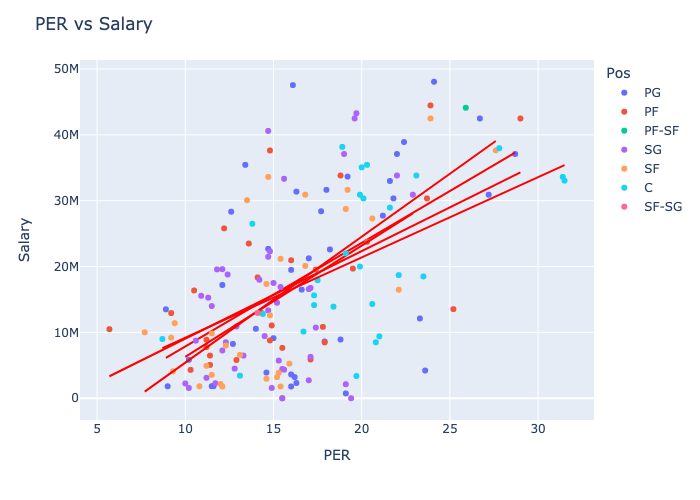

In [18]:
# use plotly to plot the data

import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

fig = px.scatter(final_merged_df, x='PER', y='salary_numeric', hover_name='Player', trendline='ols', trendline_color_override='red', color='Pos')
fig.update_layout(title='PER vs Salary', xaxis_title='PER', yaxis_title='Salary')
fig.show()



From this graph, we plotted each players PER and salary and then produced a linear regression line for each position. It appears that there is more of a correlation between certain position's when comparing salary and PER. We can filter to specific positions and see if there is a correlation between salary and PER. We also expected there to be a strong correlation between PER and salary. This is because PER is one of the best encomapssing stats for determing a player's overall performance.

Important: Salaries for players are affected by a variety of different factors, not only just player performance. Different teams and players have certain agreements in place and there are many factors that affect the salary of an NBA player. One of the factors which can skew the data in this is how big of contracts other players with similar stats recieved in free agency. We can explore players that have similar stats and see if they were also payed similar amounts.

For more information about free agency, visit [Free Agency](https://www.youtube.com/watch?v=O8AHhTSgYrM)

<Axes: xlabel='PER', ylabel='salary_numeric'>

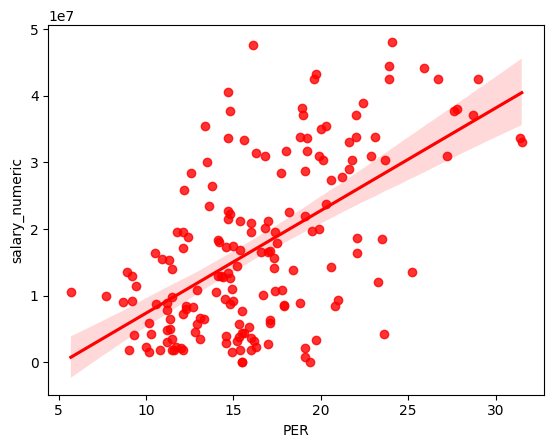

In [19]:

sns.regplot(x='PER', y='salary_numeric', data=final_merged_df, color='red')

From the graph with all the positions and the PER, we can once again see that there is a strong correlation betweem PER and salary for the player. Again, this makes sense as PER encomapsses overall player performance and it makes sense that better player performance corresponds with a higher salary.

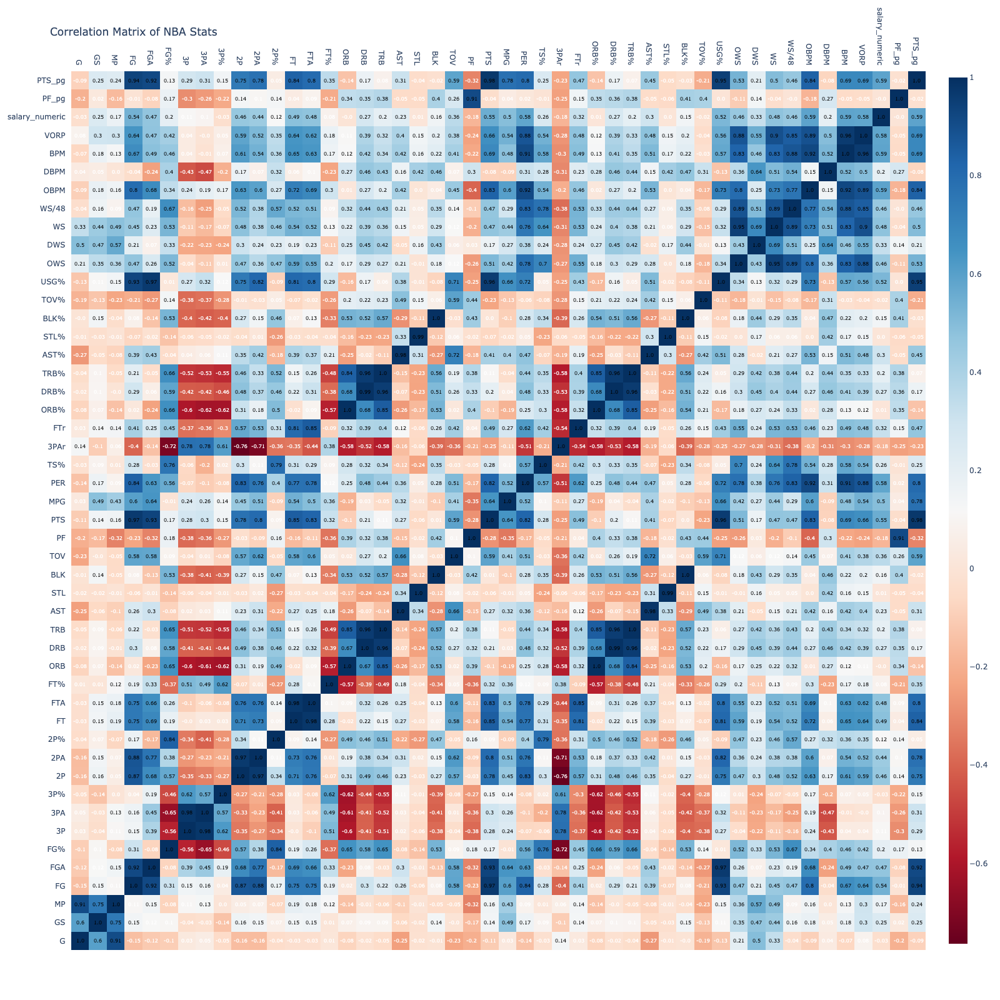

In [20]:
import plotly.figure_factory as ff
# make a correlation matrix of the data
corr = final_merged_df[['G', 'GS', 'MP', 'FG', 'FGA',
       'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'MPG',
       'PER', 'TS%', '3PAr', 'FTr', 'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%',
       'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS', 'WS', 'WS/48',
       'OBPM', 'DBPM', 'BPM', 'VORP', 'salary_numeric', 'PF_pg', 'PTS_pg']].corr()

# make the heatmap with the correlation values in each box
fig = ff.create_annotated_heatmap(
    z=corr.values,
    x=list(corr.columns),
    y=list(corr.index),
    annotation_text=corr.round(2).values,
    showscale=True,
    colorscale='RdBu',
    font_colors=['white', 'black']
)
# make the annotation text smaller
for i in range(len(fig.layout.annotations)):
    fig.layout.annotations[i].font.size = 8

fig.update_layout(title='Correlation Matrix of NBA Stats', width=1600, height=1600)
fig.show()



Here, we display a correlation matrix / heatmap of the various feature in our dataframe. We can look at this and observe if we notice any intersting observations. As expected, there is a strong correlation between PPG and MPG. There are relatively strong correlations between MPG and the various counting stats in the dataframe (AST, BLK, TOV, etc.)

### Principial Component Analysis

Principal Component Analysis is a method of dimensionality reduction. We reduce the number of features in the dataset and extract two new features to visualize in a 2D space. This allows us to cluster different players with each other and make interesting observations.

We are going to make three of these plots overall:
- One for overall statistics
- One for offensive statistics
- One for defensive statistics

Principal Component Analysis is used here to reduce the number of variables so we can visualize it in a 2D space. We can also extract important features to use into a ML model later.

For more information about PCA and how it works in data science:
- [PCA Explanation](https://builtin.com/data-science/step-step-explanation-principal-component-analysis)
- [PCA Video](https://www.youtube.com/watch?v=FgakZw6K1QQ)



We create a dataframe with the 2 principle components extracted and add in other relevant information, such as salary to allows us to compare if similar players have similar salaries. We can then graph out findings with a scatter plot in Plotly to anaylze the data.

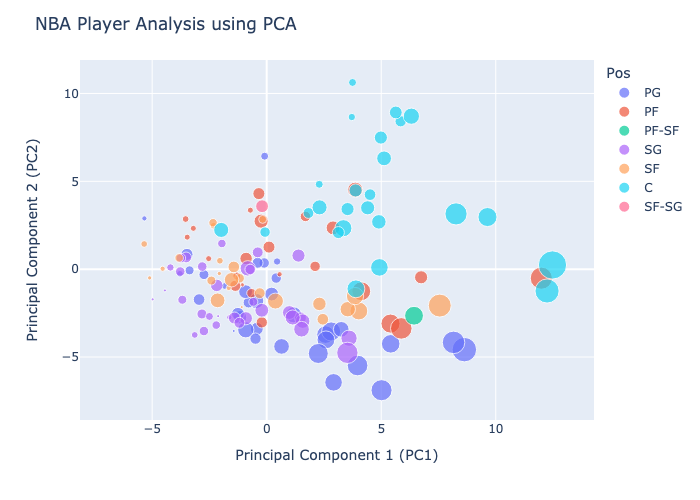

In [21]:
from sklearn.decomposition import PCA
import plotly.express as px

X = df_normalized[['FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'MPG', 'PER', 'TS%', '3PAr', 'FTr',
       'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS', 'WS', 'WS/48',
       'OBPM', 'DBPM', 'BPM', 'VORP']]

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)


df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['Pos'] = df_normalized['Pos']
df_pca['Player'] = df_normalized['Player']
df_pca['salary_numeric'] = df_normalized['salary_numeric']
df_pca['VORP'] = final_merged_df['VORP']

# If VORP is negative, make it 0
df_pca['VORP'] = df_pca['VORP'].apply(lambda x: 0 if x < 0 else x)

fig = px.scatter(df_pca, x='PC1', y='PC2', color='Pos', size='VORP',
                 hover_name='Player', hover_data=['salary_numeric', 'VORP'], size_max=20)


fig.update_layout(title='NBA Player Analysis using PCA', xaxis_title='Principal Component 1 (PC1)',
                  yaxis_title='Principal Component 2 (PC2)')

fig.show()


From the Overall Impact PCA plot, we can see that there appears to be clusters in the graph. Specifically, guard and playmaking positions seem to be towards the bottom of the graph while big men and anchor positions seem to be more towards the top of the graph. Players to the right are considered "superstar" players and players to the left are considered "role" players.

There appears to be a trend of guards (PG and SG) more towards the bottom of the graph. This could be becuase these players are typically better offensively and not as good defensively.

The centers are clustered towards the top middle of the graph. This could be due to the fact that centers are typically better defensively and not as good offensively. They also tend to get more rebounds and blocks which could be part of the reason they are more towards the top of graph.

To further analyze the players, we are going to graph an offensive contribution and defensive contribution PCA graph and explore further trends.

For the Offensive Impact PCA, we are using the following features: 
- `FG`
- `FGA`
- `FG%`
- `3P`
- `3PA`
- `3P%`
- `2P`
- `2PA`
- `2P%`
- `FT`
- `FTA`
- `FT%`
- `ORB`
- `AST`
- `PTS`
- `MPG`
- `PER`
- `TS%`
- `3PAr`
- `FTr`
- `OWS`
- `OBPM`
- `USG%`

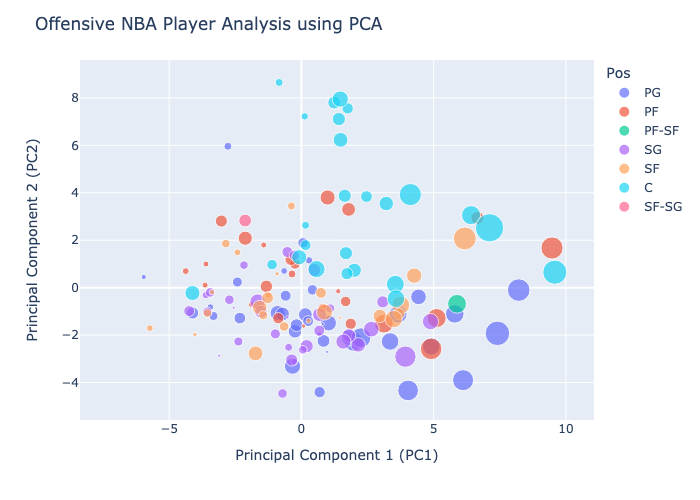

In [22]:
# make the Offensive Impact PCA

X = df_normalized[['FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%', 'ORB', 'AST', 'PTS', 'MPG', 'PER', 'TS%', '3PAr', 'FTr', 'OWS', 'OBPM', 'USG%']]
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a dataframe with the 2 principal components and additional player information
df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['Pos'] = df_normalized['Pos']
df_pca['Player'] = df_normalized['Player']
df_pca['salary_numeric'] = df_normalized['salary_numeric']
df_pca['VORP'] = final_merged_df['VORP']

# If OWS is negative, make it 0
df_pca['VORP'] = df_pca['VORP'].apply(lambda x: 0 if x < 0 else x)

# Create a scatter plot of the data
fig = px.scatter(df_pca, x='PC1', y='PC2', color='Pos', size='VORP',
                    hover_name='Player', hover_data=['salary_numeric', 'VORP'], size_max=20)

# Set the plot title and axes labels
fig.update_layout(title='Offensive NBA Player Analysis using PCA', xaxis_title='Principal Component 1 (PC1)',
                        yaxis_title='Principal Component 2 (PC2)')
# Show the plot
fig.show()

In this graph of the offensive contributions, we can see that some of the players that were better players in the overall chart are shifted back. This is because they are not as good offensively as they are defensively. We should expect to see a trend like this in the defensive contribution graph as well. We again see the gaurds towards the bottom of the graph and the centers towards the top middle of the graph.

We also observe that the closer to the top right of the graph the higher the salary. This make sense because players that are better offensively would earn more money than other playesr. We would expect to see a similar trend for the defensive graph as well.

For the defensive impact graph, we use the following features:'DRB', 'STL', 'BLK', 'TOV', 'PF', 'DRB%', 'STL%', 'BLK%', 'TOV%', 'DWS', 'DBPM', 'BPM', 'WS/48'
- `DRB`
- `STL`
- `BLK`
- `TOV`
- `PF`
- `DRB%`
- `STL%`
- `BLK%`
- `TOV%`
- `DWS`
- `DBPM`
- `BPM`
- `WS/48`

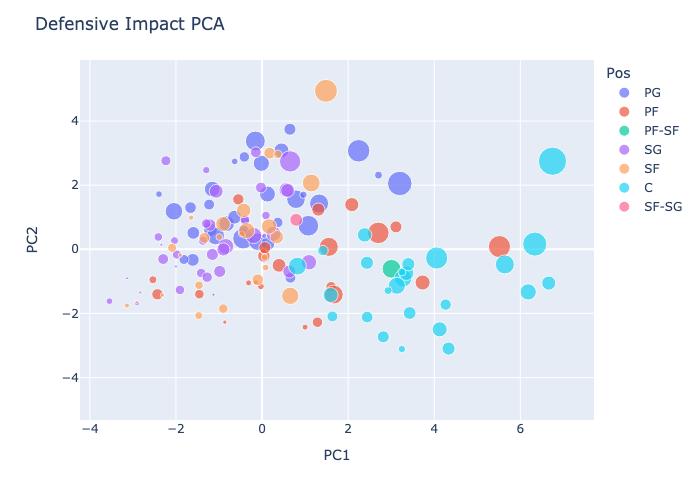

In [23]:
X_def= df_normalized[['DRB', 'STL', 'BLK', 'TOV', 'PF', 'DRB%', 'STL%', 'BLK%', 'TOV%', 'DWS', 'DBPM', 'BPM', 'WS/48']]

pca_def = PCA(n_components=2)
X_def_pca = pca_def.fit_transform(X_def)

df_def_pca = pd.DataFrame(data=X_def_pca, columns=['PC1', 'PC2'])
df_def_pca['Pos'] = df_normalized['Pos']
df_def_pca['Player'] = df_normalized['Player']
df_def_pca['salary_numeric'] = df_normalized['salary_numeric']
df_def_pca['VORP'] = final_merged_df['VORP']

# if VORP is negative, make it 0
df_def_pca['VORP'] = df_def_pca['VORP'].apply(lambda x: 0 if x < 0 else x)

# plot the Offensive Impact PCA
fig = px.scatter(df_def_pca, x='PC1', y='PC2', hover_name='Player', color='Pos', size='VORP', hover_data=['salary_numeric', 'VORP'], size_max=20)
fig.update_layout(title='Defensive Impact PCA', xaxis_title='PC1', yaxis_title='PC2')


fig.show()

In this graph, we see high output offensive players like Luka Doncic shift back left because they are not as good defensively as they are offensively. Again, there appears to be a trend by position and type of role that each player has on their respective team.

Players like Nic Claxton and Jaren Jackson Jr. crash the boards heavily (get lots of rebounds) and are much further right than before. 

Again, player in the bottom left corner are considered to be more role players and players in the top right corner are considered to be more superstar players.

Here, we see an interesting trend where there are players with bigger contracts on the left of the graph, meaning they are worse defensively yet still have bigger contracts. This seems to pain the pictures that the NBA and owners care more about offensive production than defensive production.

### K-Means Clustering

K-means clustering is a unsupervised maching learning algorithm that is used to cluster data together. Basically, the algorithm works by initializing K points and assigning each data point to the closest cluster based on a distance method, sometimes Euclidean distance. Then, the algorithm will move the K points based on the mean of the data points in the cluster. This is repeated until the K points do not move anymore.

We can then use the  [elbow method](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html#:~:text=The%20elbow%20method%20runs%20k,point%20to%20its%20assigned%20center.) to determing the optimal number of clusters for the data. 

For more details on K-Means clustering:
- [K-Means Video](https://www.youtube.com/watch?v=4b5d3muPQmA)
- [K-Means Explanation](https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1)

We want to determine if players that are similar to each other have similar contracts to each other as well. This would make sense as in free agency players with similar stats would likely get similar contracts (although this heavily depends on each team's needs, cap space, and other factors like if a player is still on their rookie contract or not). We can use K-means clustering to group the players together and then perform analysis on the clusters.

We perform K-means to determin clustering of the players. We create a new dataframe with the PCA components from earlier and add in the player and position. We then merge the datadframe with the original stats dataframe.

Finally, we merge the dataframe with the original stats dataframe. We loop through and print the player, the cluster they are part of, and their stats.

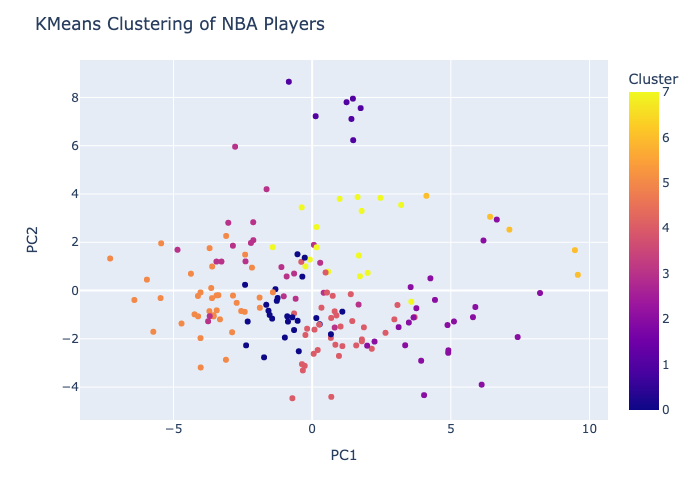

In [24]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

stats = ['G', 'GS', 'MP', 'FG', 'FGA',
       'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'MPG',
       'PER', 'TS%', '3PAr', 'FTr', 'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%',
       'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS', 'WS', 'WS/48',
       'OBPM', 'DBPM', 'BPM', 'VORP']

df_normalized_kmeans = pd.DataFrame(df_normalized, columns=stats)


kmeans = KMeans(n_clusters=8, random_state=42)
kmeans.fit(df_normalized_kmeans)

df_kmeans = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_kmeans['Cluster'] = kmeans.labels_
df_kmeans['Pos'] = df_normalized['Pos']
df_kmeans['Player'] = df_normalized['Player']
df_kmeans[stats] = df_normalized_kmeans[stats]


cluster_df = pd.DataFrame({'Player': df_normalized['Player'], 'Cluster': kmeans.labels_})

cluster_df_merged = pd.merge(cluster_df, df_normalized_kmeans, left_index=True, right_index=True)


for i in range(8):
    #print(f"Cluster {i}:")
    cluster_players = cluster_df_merged[cluster_df_merged['Cluster'] == i]['Player']
    for player in cluster_players:
        player_stats = cluster_df_merged[cluster_df_merged['Player'] == player].iloc[0, 2:]
        #print(f"{player}: {player_stats.to_dict()}")
    #print()

fig = px.scatter(df_kmeans, x='PC1', y='PC2', color='Cluster', hover_name='Player')
fig.update_layout(title='KMeans Clustering of NBA Players')
fig.show()

final_merged_df['Cluster'] = kmeans.labels_

We can also improve on the clustering here byy using the PCA data we generated earlier. This will allows us to group players based on their overall, offensive, and defensive impact. 

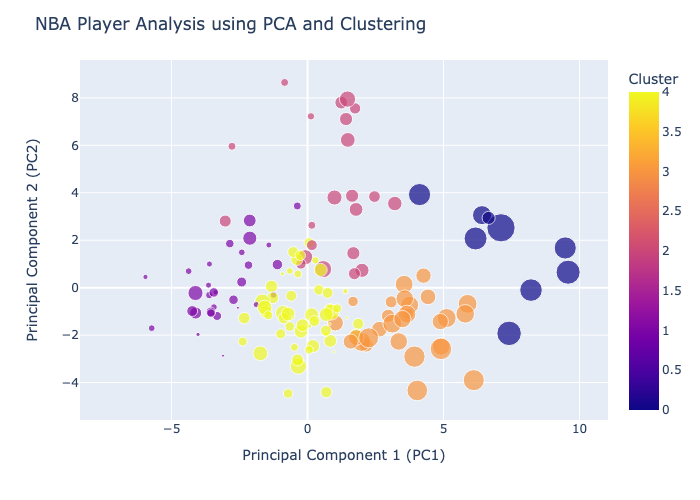

In [25]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import plotly.express as px
import plotly.graph_objs as go


X = df_normalized[['FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'MPG', 'PER', 'TS%', '3PAr', 'FTr',
       'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS', 'WS', 'WS/48',
       'OBPM', 'DBPM', 'BPM', 'VORP']]
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

kmeans = KMeans(n_clusters=5, n_init=10)
kmeans.fit(X_pca)
df_pca['Cluster'] = kmeans.labels_

fig = px.scatter(df_pca, x='PC1', y='PC2', color='Cluster', size='VORP',
                 hover_name='Player', hover_data=['salary_numeric', 'VORP'], size_max=20)
fig.update_layout(title='NBA Player Analysis using PCA and Clustering', xaxis_title='Principal Component 1 (PC1)',
                  yaxis_title='Principal Component 2 (PC2)')
fig.show()


We see 5 clear, distinct clusters from the PCA clustering graph. We can see that the more traditional big men are towards the top of the graph (think grabbing rebounds, spending most of their time in the paint.)

Then we have the cluster to the right. This seems to be the superstar players. The cluster towards the bottom right are also superstar players, with most of them being guards or forwards. We have superstar players like Kevin Durant, Lebron James, and Luka Doncic in this cluster. The cluster to the left of that seems to be mainly role player guards. They do not perform as well as the others and therefore are clustered with each other. The furthest left cluster seems to be bench warmers and role players, with a mix of the guard forwards and center positions. These players are overall bnot making much of an impact on the game and therefore clustered together.



We want to determine if the clusters are good so we can use the elbow method to determine this.

Text(0, 0.5, 'Distortion')

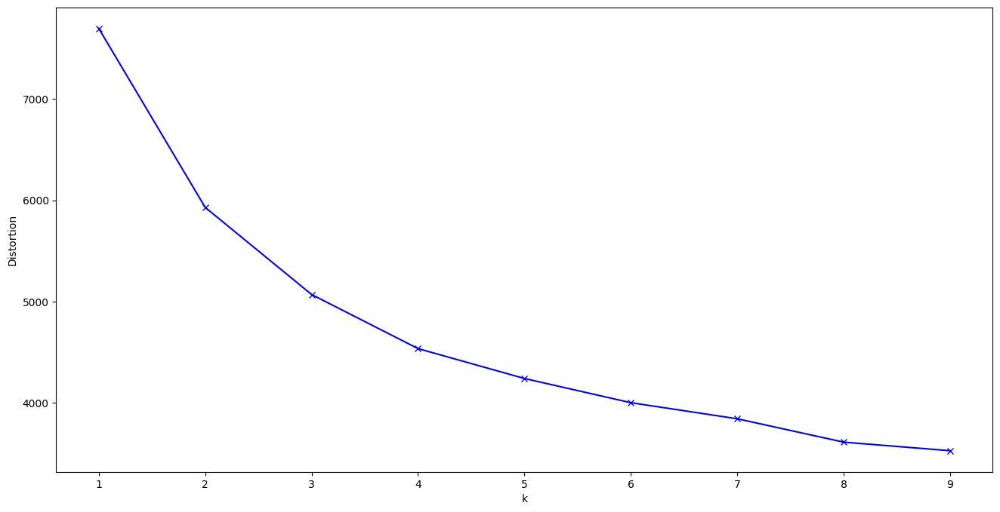

In [26]:
distortions = []
K = range(1, 10)
for k in K:
       kmeanModel = KMeans(n_clusters=k)
       kmeanModel.fit(df_normalized_kmeans)
       distortions.append(kmeanModel.inertia_)
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')

After getting the clusters and displaying the data in each of them, we can plot the different clusters we have and the data in them to show how similar the players are in each cluster. It appears 9 clusters is the optimal amount of clusters for this data.

From the cluster graph, it seems like we should increase the number of clusters in the graph to increase the accuracy of the clusters.

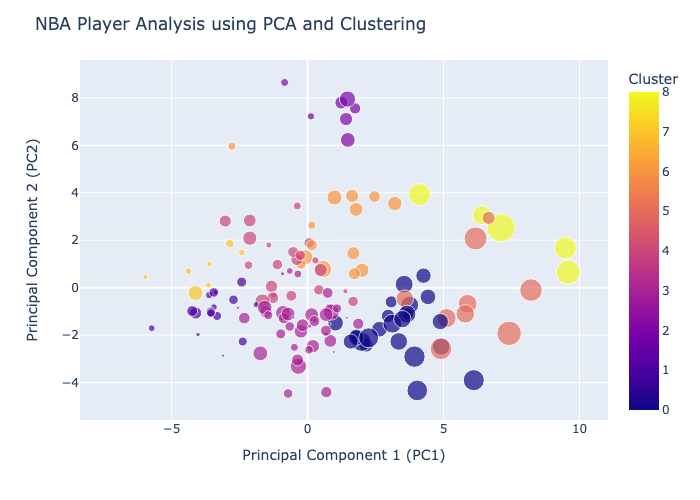

In [27]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import plotly.express as px
import plotly.graph_objs as go


X = df_normalized[['FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'MPG', 'PER', 'TS%', '3PAr', 'FTr',
       'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS', 'WS', 'WS/48',
       'OBPM', 'DBPM', 'BPM', 'VORP']]
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

kmeans = KMeans(n_clusters=9)
kmeans.fit(X_pca)
df_pca['Cluster'] = kmeans.labels_

fig = px.scatter(df_pca, x='PC1', y='PC2', color='Cluster', size='VORP',
                 hover_name='Player', hover_data=['salary_numeric', 'VORP'], size_max=20)
fig.update_layout(title='NBA Player Analysis using PCA and Clustering', xaxis_title='Principal Component 1 (PC1)',
                  yaxis_title='Principal Component 2 (PC2)')
fig.show()


From increasing the clusters, we can see that the players are indeed grouper better together by their playstyle. The traditional big men are at the top and the number of them decreased. The 2-3 clusters of superstart players are still towards the right of the graph. The role players are still towards the bottom left. The bench warmers are to the very left of the graph. Now, we have a cluster of guards towards the bottom of the graph. We also have other big men below the traditional ones. We have more defensive guards above more offensive ones towards the left og the graph. We have players that do not perform well offensively or defensively towards the bottom left of the graph.

From the cluster graphs we can tell that players with similar stats are grouped with each other.

In [28]:
import plotly.express as px

# sort by PTS_pg and keep the column in the datafram
final_merged_df.sort_values('PTS', ascending=False, inplace=True)
final_merged_df

,Player,2022-23,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,MPG,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,,,OWS,DWS,WS,WS/48,,,OBPM,DBPM,BPM,VORP,salary_numeric,PF_pg,PTS_pg,Cluster
6,Giannis Antetokounmpo,"$42,492,492",PF,28.0,MIL,63.0,63.0,2024.0,12.6,22.7,0.553,0.8,3.0,0.275,11.7,19.7,0.596,8.9,13.7,0.645,2.4,10.8,13.2,6.4,0.9,0.9,4.4,3.5,34.8,32.126984,29.0,0.605,0.134,0.604,7.3,30.0,19.1,33.2,1.2,2.1,13.2,38.8,,,4.9,3.7,8.6,0.204,,,5.8,2.7,8.5,5.4,42492492,3.1,31.1,6
25,Joel Embiid,"$33,616,770",C,28.0,PHI,66.0,66.0,2284.0,11.5,20.9,0.548,1.0,3.2,0.330,10.4,17.8,0.587,10.4,12.2,0.857,1.8,8.8,10.6,4.3,1.0,1.8,3.6,3.2,34.4,34.606061,31.4,0.655,0.151,0.581,5.9,28.3,17.3,22.9,1.4,4.6,11.9,37.0,,,8.4,3.9,12.3,0.259,,,6.8,2.3,9.2,6.4,33616770,3.1,33.1,6
16,Luka Dončić,"$37,096,500",PG,23.0,DAL,66.0,66.0,2391.0,10.8,21.8,0.496,2.8,8.1,0.342,8.0,13.7,0.588,7.8,10.4,0.742,0.8,7.8,8.6,8.0,1.4,0.5,3.6,2.5,32.2,36.227273,28.7,0.609,0.373,0.479,2.6,25.4,13.8,42.3,1.9,1.2,11.9,37.6,,,7.3,2.9,10.2,0.204,,,7.6,1.4,9.0,6.6,37096500,2.5,32.4,2
5,Damian Lillard,"$42,492,492",PG,32.0,POR,58.0,58.0,2107.0,9.5,20.5,0.463,4.2,11.2,0.371,5.3,9.3,0.574,8.7,9.5,0.914,0.8,4.0,4.7,7.3,0.9,0.3,3.3,1.9,31.9,36.327586,26.7,0.645,0.547,0.464,2.4,12.8,7.6,35.0,1.2,0.8,11.7,33.8,,,8.2,0.8,9.0,0.205,,,8.3,-1.2,7.1,4.9,42492492,1.9,32.2,2
33,Shai Gilgeous-Alexander,"$30,913,750",PG,24.0,OKC,68.0,68.0,2416.0,10.5,20.6,0.510,0.9,2.5,0.345,9.6,18.1,0.533,10.0,11.0,0.905,0.9,4.0,4.9,5.5,1.7,1.0,2.9,2.9,31.8,35.529412,27.2,0.626,0.122,0.535,2.6,12.2,7.3,25.7,2.2,2.5,10.1,32.8,,,8.4,3.0,11.4,0.226,,,5.8,1.5,7.3,5.6,30913750,2.8,31.4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,Justise Winslow,"$4,097,561",SF,26.0,POR,29.0,11.0,776.0,3.8,9.2,0.409,0.6,2.1,0.311,3.1,7.1,0.438,0.9,1.3,0.714,2.3,4.5,6.7,4.5,1.4,0.5,2.0,4.1,9.1,26.758621,9.3,0.466,0.227,0.141,7.2,14.3,10.7,17.2,1.9,1.3,17.0,14.2,,,-0.1,0.5,0.4,0.022,,,-3.5,0.7,-2.8,-0.2,4097561,3.1,6.8,3
112,Maxi Kleber,"$9,000,000",C,31.0,DAL,37.0,5.0,930.0,3.0,6.5,0.456,1.5,4.3,0.348,1.5,2.2,0.667,1.0,1.5,0.711,1.2,4.1,5.2,2.0,0.5,1.2,1.0,3.3,8.5,25.135135,8.7,0.592,0.663,0.225,3.7,13.3,8.4,7.5,0.6,2.9,12.7,10.3,,,0.7,0.6,1.3,0.067,,,-2.2,0.0,-2.2,0.0,9000000,2.3,5.9,5
106,Reggie Bullock,"$10,012,800",SF,31.0,DAL,78.0,55.0,2364.0,2.9,7.2,0.409,2.3,6.0,0.380,0.6,1.1,0.562,0.4,0.6,0.703,0.5,3.8,4.3,1.6,0.8,0.2,0.5,2.5,8.5,30.307692,7.7,0.577,0.845,0.079,1.6,12.5,7.0,6.2,1.1,0.5,6.9,10.0,,,1.3,1.4,2.8,0.056,,,-2.2,-0.3,-2.6,-0.4,10012800,2.1,7.2,5
92,Patrick Beverley,"$13,506,508",PG,34.0,TOT,67.0,67.0,1816.0,2.9,7.1,0.400,1.6,4.7,0.335,1.3,2.4,0.529,0.9,1.3,0.723,0.9,4.0,4.9,3.8,1.2,0.8,1.2,3.7,8.2,27.104478,8.9,0.534,0.664,0.181,2.7,12.0,7.5,13.3,1.7,2.0,13.4,10.6,,,0.8,2.1,3.0,0.079,,,-2.9,1.7,-1.3,0.3,13506508,2.8,6.2,5


From the table, it is clear that players with similar stats have around similar contracts to each other. This is due to the nature of the free agency market in the NBA. The player available for free agency in that off-season will all compete with each other for the best contracts. Players that are similar to each other will likely recieve similar contracts to one another. However, there is always the outlier where a player who either overperforms or underperforms against similar players will get overrewarded or underrewareded accordingly.

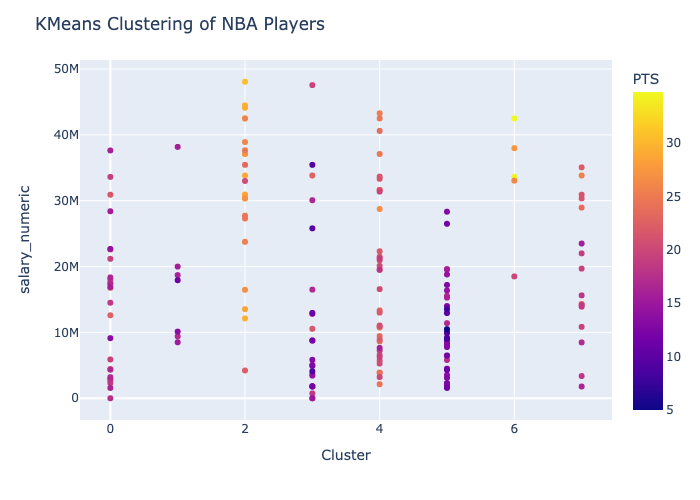

In [29]:
# plot the players in each cluster with the salary they earned
fig = px.scatter(final_merged_df, x='Cluster', y='salary_numeric', color='PTS', hover_name='Player')
fig.update_layout(title='KMeans Clustering of NBA Players')
fig.show()


From this cluster graph, we can see that the players with lower salary contracts are closer to each other than the player with higher value contracts. This is due to the fact of superstars and star players in the NBA. They attract more attention and are much more valuable than other players due to their "percieved" skills. Typically, the best player in free agency will recieve the highest contract even if there is a player with similar stats to them. Additionally, player contracts depend on if they are still on their rookie deal or if they are eligible to resign with a team. This can skew the data as well. It also also skew the data if a player wants to request a trade or if a player is known to be injury prone and therefore does not recieve as much money.

I show the salary of each player in each cluster as well as the players in their respective clusters with salary data on hover. This is to better visualize the data we have. We can definetly determine that there is a correlation between increased player performance and higher salary.

The graph seems to show there is a correlation between performance and salary, but also indicating there may be other factors affecting their overall salary.

## Hypothesis Testing

We can use hypothesis testing to determine if and what relationship exists between the various statistics in the dataframe and salary for a player. We should see which variables are of statistical significance and use these in our testing. Eventually, we can feed the data into a ML model and see which it outputs for determining salary.

We will not test each variable in the dataframe as that would be too much. We will test the variables that are of statistical significance and then feed the data into a ML model to see which variables it outputs as being the most important.

In [30]:
# use the variables and determine which variables are of statistical significance

import statsmodels.api as sm
import statsmodels.formula.api as smf

# rename WS/48 to WS_per_48
df_normalized.rename(columns={'WS/48': 'WS_per_48'}, inplace=True)
df_normalized.rename(columns={'2P': 'twoP'}, inplace=True)
df_normalized.rename(columns={'2PA': 'twoPA'}, inplace=True)
df_normalized.rename(columns={'2P%': 'twoP_pct'}, inplace=True)
df_normalized.rename(columns={'3P': 'threeP'}, inplace=True)
df_normalized.rename(columns={'3PA': 'threePA'}, inplace=True)
df_normalized.rename(columns={'3P%': 'threeP_pct'}, inplace=True)
df_normalized.rename(columns={'eFG%': 'eFG_pct'}, inplace=True)
df_normalized.rename(columns={'FT%': 'FT_pct'}, inplace=True)
df_normalized.rename(columns={'TS%': 'TS_pct'}, inplace=True)
df_normalized.rename(columns={'3PAr': 'threePAr'}, inplace=True)
df_normalized.rename(columns={'FG%': 'FG_pct'}, inplace=True)
df_normalized.rename(columns={'FT%': 'FT_pct'}, inplace=True)
df_normalized.rename(columns={'ORB%': 'ORB_pct'}, inplace=True)
df_normalized.rename(columns={'DRB%': 'DRB_pct'}, inplace=True)
df_normalized.rename(columns={'TRB%': 'TRB_pct'}, inplace=True)
df_normalized.rename(columns={'AST%': 'AST_pct'}, inplace=True)
df_normalized.rename(columns={'STL%': 'STL_pct'}, inplace=True)
df_normalized.rename(columns={'BLK%': 'BLK_pct'}, inplace=True)
df_normalized.rename(columns={'TOV%': 'TOV_pct'}, inplace=True)
df_normalized.rename(columns={'USG%': 'USG_pct'}, inplace=True)


predictors = ['PTS_pg', 'Age', 'threeP_pct', 'DWS', 'FT_pct', 'BLK_pct', 'FTA', 'FT', 'TOV_pct', 'GS', 'PTS', 'ORB', 'ORB_pct', 'STL', 'TRB', 'DRB', 'DBPM', 'OWS', 'WS', 'STL_pct', 'AST', 'USG_pct', 'WS_per_48', 'threePA', 'threeP',
                'FG', 'FG_pct', 'twoP_pct', 'MPG', 'G', 'MP', 'threePAr', 'twoPA', 'PER', 'OBPM', 'AST_pct', 'VORP', 'DRB_pct', 'TRB_pct', 'PF', 'FGA', 'BPM', 'TOV', 'TS_pct', 'twoP', 'FTr', 'BLK', 'PF_pg']

# create a formula string
formula_str = 'salary_numeric ~ ' + ' + '.join(predictors)

# create a model
model = smf.ols(formula=formula_str, data=df_normalized).fit()

print(model.summary())


                            OLS Regression Results                            
Dep. Variable:         salary_numeric   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.654
Method:                 Least Squares   F-statistic:                     7.748
Date:                Fri, 12 May 2023   Prob (F-statistic):           3.09e-20
Time:                        01:17:15   Log-Likelihood:                -123.83
No. Observations:                 172   AIC:                             345.7
Df Residuals:                     123   BIC:                             499.9
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -3.6260      0.382     -9.492      0.0

The linear regression model has a R^2 value of 0.751. This is a decent fit for the model. The probability of the F-statistic is very low which indicated that the model is statistically significant.

We want to determine which variables are statistically significant so we will print the p values of all of them and then list the ones that have a p-values less than 0.05, meaning we can reject the null hypothesis of no relationship between that variable and salary.

In [31]:
# create a table of the p values and the variable names
p_values = model.pvalues
p_values = pd.DataFrame(p_values)
p_values.reset_index(inplace=True)
p_values.rename(columns={'index': 'variable', 0: 'p_value'}, inplace=True)
p_values

,variable,p_value
0,Intercept,2.291764e-16
1,PTS_pg,7.907719e-01
2,Age,1.589782e-16
3,threeP_pct,1.810786e-02
4,DWS,1.234107e-01
5,FT_pct,4.007528e-01
6,BLK_pct,8.249191e-01
7,FTA,7.692753e-01
8,FT,2.247976e-01
9,TOV_pct,8.168845e-01


In [32]:
p_values[p_values['p_value'] < 0.05]

,variable,p_value
0,Intercept,2.291764e-16
2,Age,1.589782e-16
3,threeP_pct,1.810786e-02


We will create a table of the coefficients and variable names to plot using Plotly. We also normalize the coefficients to better visualize the data.

In [33]:
coefficients = model.params
coefficients = pd.DataFrame(coefficients)
coefficients.reset_index(inplace=True)
coefficients.rename(columns={'index': 'variable', 0: 'coefficient'}, inplace=True)

#normalize the coefficients
coefficients['coefficient'] = coefficients['coefficient']/coefficients['coefficient'].sum()


coefficients

,variable,coefficient
0,Intercept,1.168865
1,PTS_pg,0.090868
2,Age,-0.044254
3,threeP_pct,0.084425
4,DWS,-0.530893
5,FT_pct,0.038632
6,BLK_pct,-0.048795
7,FTA,0.081799
8,FT,-0.641359
9,TOV_pct,-0.018297


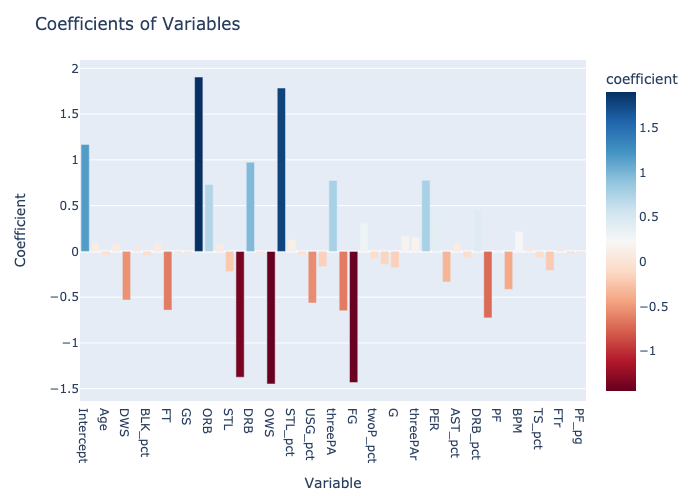

In [34]:
# create a bar chart of the coefficients
fig = px.bar(coefficients, x='variable', y='coefficient', color='coefficient', color_continuous_scale='RdBu')
fig.update_layout(title='Coefficients of Variables', xaxis_title='Variable', yaxis_title='Coefficient')
fig.show()

We graph the coefficients of the variables to see which ones are the most important. We see that PTS, WS, and the intercept (PTS_pg) all have high values which indicate they are more important. We see TRB, OWS, and FG all have strong negative coefficients. We see ORB, DRB, 3 point attempts, and two points attempts also have high coefficients.

We can make a graph of the residuals vs the fitted values to see if there is a pattern in the data.

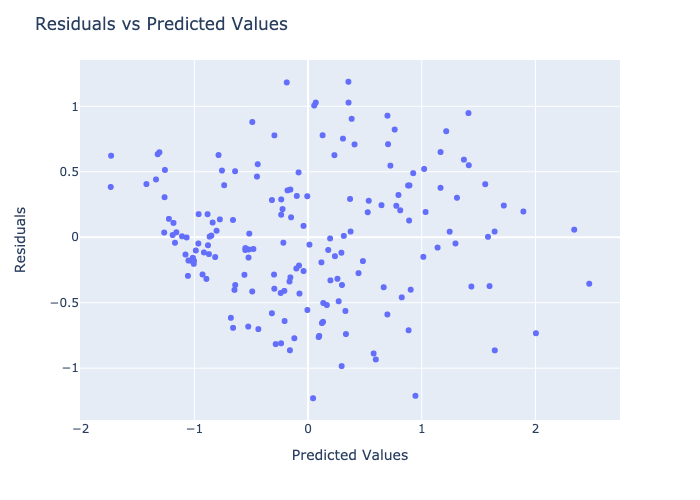

In [35]:
# create a table of the residuals
residuals = model.resid
residuals = pd.DataFrame(residuals)
residuals.reset_index(inplace=True)
residuals.rename(columns={'index': 'index', 0: 'residual'}, inplace=True)

# add the predicted values and the actual values to the table
residuals['predicted'] = model.predict()
residuals['actual'] = df_normalized['salary_numeric']

# plot the residuals against the predicted values
fig = px.scatter(residuals, x='predicted', y='residual')
fig.update_layout(title='Residuals vs Predicted Values', xaxis_title='Predicted Values', yaxis_title='Residuals')
fig.show()


The residuals graph appears to be randomly distributed around 0 and there are no clear and obvious patterns in the data. This is good as it means the model is a good fit for the data. The residuals do seem to be more spread out in the middle than the ends which could indicate that the model is not the best fit. 

We now make a linear regression plot with each variable and salary to see how strong the correlation is. We graph the top 15 using plotly.

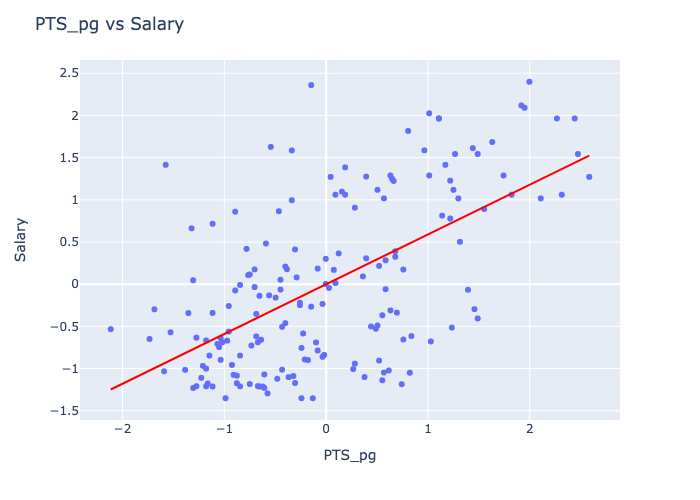

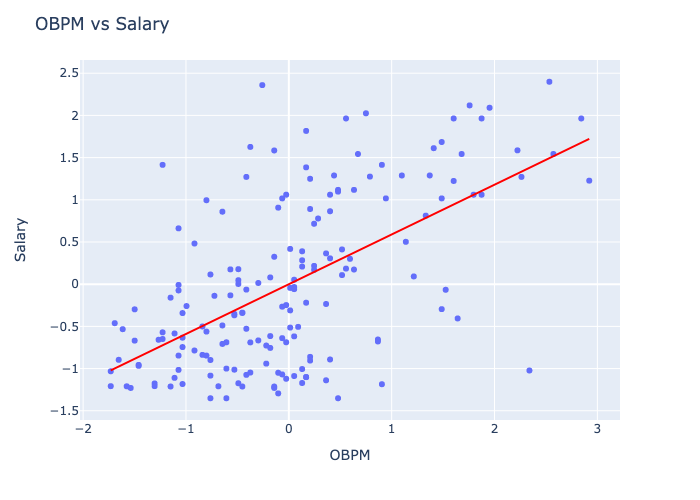

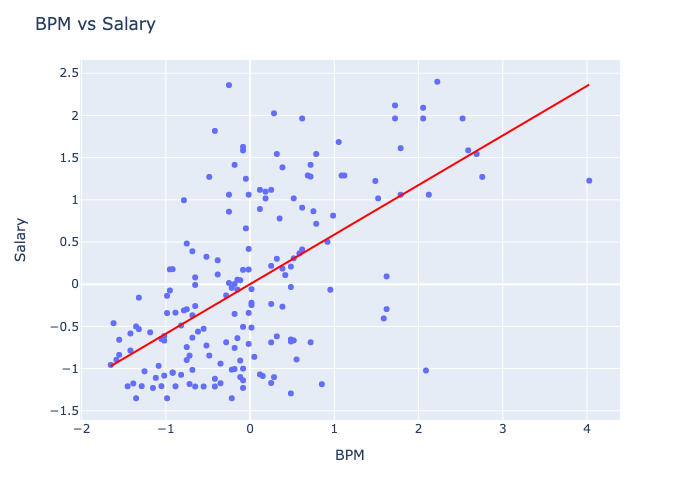

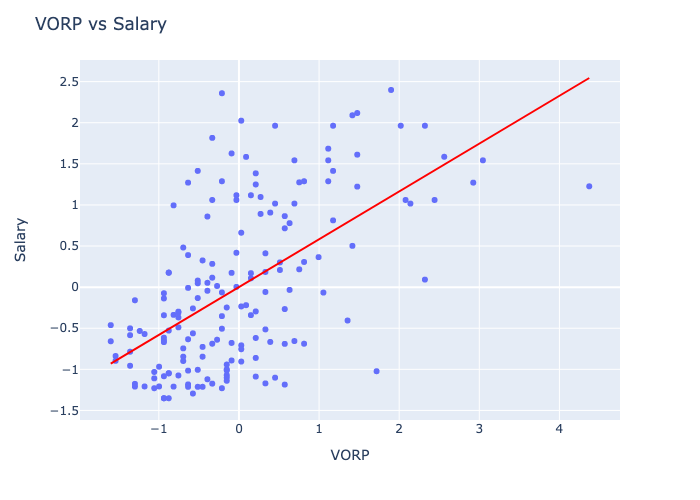

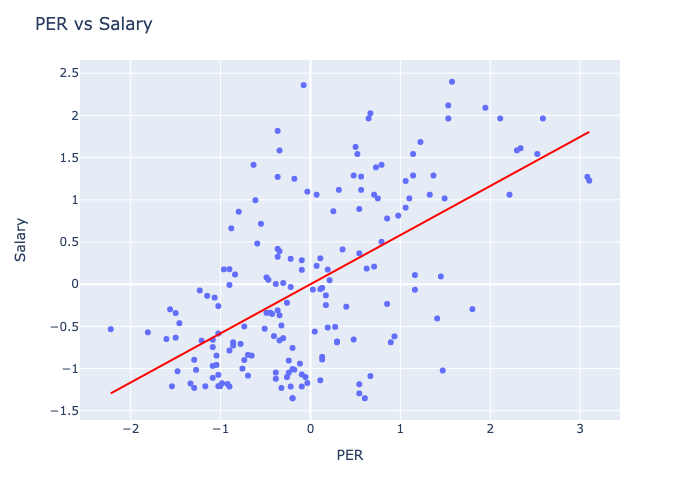

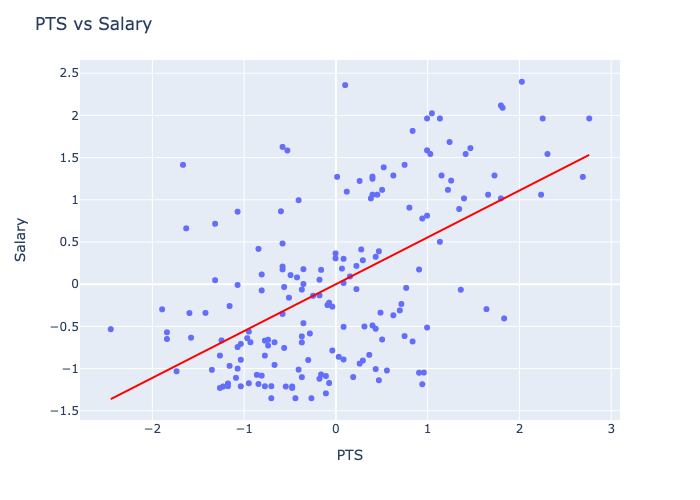

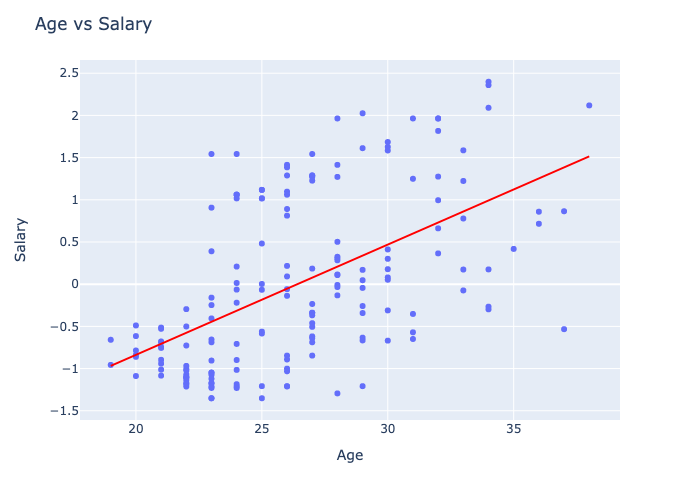

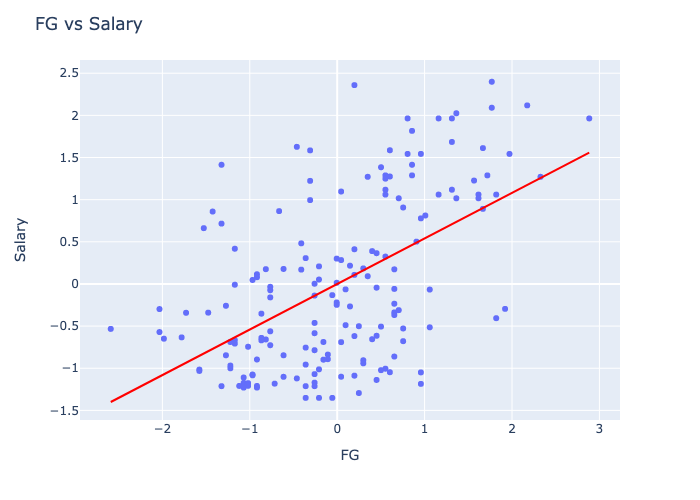

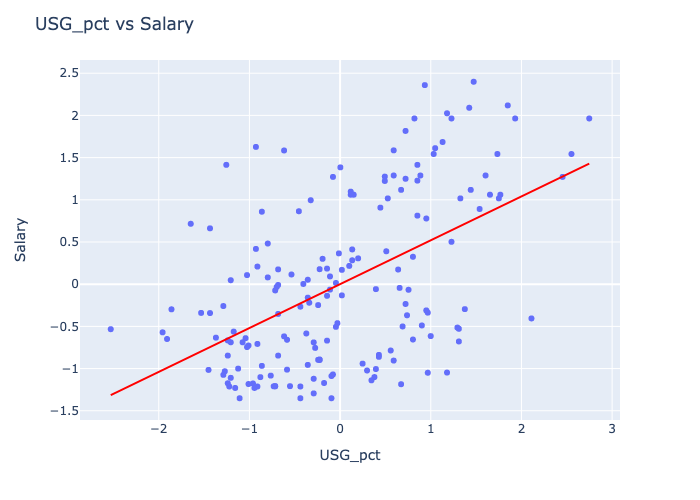

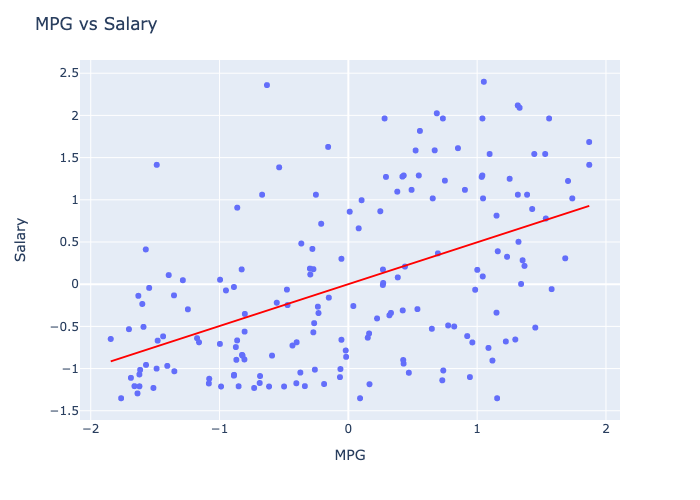

PTS_pg    0.589731
OBPM      0.589718
BPM       0.587087
VORP      0.581893
PER       0.581833
PTS       0.554699
FG        0.540546
USG%      0.519679
MPG       0.495938
FT        0.485431
WS        0.477326
FTA       0.475812
FGA       0.468992
2P        0.456408
WS/48     0.455266
Name: salary_numeric, dtype: float64

In [36]:
cols = [col for col in df_normalized.columns if col not in ['Player', 'Pos', 'Tm_x','Tm_y', '2022-23', '2023-24', '2024-25', '2025-26', '2026-27',
       '2027-28', 'Guaranteed']]

df_normalized[cols].corr()

top_15 = df_normalized[cols].corr()['salary_numeric'].sort_values(ascending=False)[1:11].index


for col in top_15:
    fig = px.scatter(df_normalized, x=col, y='salary_numeric', hover_name='Player', trendline='ols', trendline_color_override='red')
    fig.update_layout(title=f'{col} vs Salary', xaxis_title=col, yaxis_title='Salary')
    fig.show()


# create a table with the top 15 correlations
corr['salary_numeric'].sort_values(ascending=False)[1:16]



There is an interesting observation with the age vs salary graph as we see vertical lines of data. We also see that salary is increasing as age increases. This is due to the fact that players become eligible for higher salary contracts once their rookie contracts expire.

We can see there is a relatively strong correlation between PTS_pg and salary. There are also relatively strong correlations between the various counting stats and salary. We can use these variables in our ML model to determine which variables are the most important.

We can look at the top 15 graph that were produced and observe the linear regression line for each. We can see that these variables all have a correlation with salary.

We can use this linear model to try and predict player salary.

We listed the top 15 variables that have the strongest correlation with increased salary. We can use these variable and feed it into a ML model to try and predict salary.

In [37]:
# use the linear regression model to predict the salary of a player

# make a table with all players and predicted salaries
X_test = df_normalized[predictors]
predictions = model.predict(X_test)
predictions = pd.DataFrame(predictions)
predictions.reset_index(inplace=True)
predictions.rename(columns={'index': 'index', 0: 'predicted_salary'}, inplace=True)
predictions['player'] = df_normalized['Player']
predictions['actual_salary'] = df_normalized['salary_numeric']
predictions['difference'] = predictions['predicted_salary'] - predictions['actual_salary']
predictions['difference'] = predictions['difference'].abs()
predictions


,index,predicted_salary,player,actual_salary,difference
0,0,2.341031,Stephen Curry,2.398757,0.057726
1,1,1.410840,Russell Westbrook,2.358922,0.948081
2,2,2.473253,LeBron James,2.118274,0.354979
3,3,1.893884,Kevin Durant,2.090566,0.196682
4,4,1.215288,Bradley Beal,2.024983,0.809694
...,...,...,...,...,...
167,167,-1.052043,Austin Reaves,-1.229670,0.177626
168,168,-1.265501,Ayo Dosunmu,-1.229670,0.035831
169,169,-0.659631,RaiQuan Gray,-1.351655,0.692024
170,170,-1.735511,Jeenathan Williams,-1.351655,0.383856


From this, we can see that the linear regression model is pretty good at predicting the salaries of players based on their stats. 

Now, we try another model instead of least square regression to see if it better fits the data. Here, we try a RandomForestRegressor model. A random forest model uses multiple decision trees to make a prediction. We will examine if this model is better than the linear regression model.

For more informatin about Random Forest Regressor, visit [Random Forest Regressor](https://towardsdatascience.com/a-quick-and-dirty-guide-to-random-forest-regression-52ca0af157f8)

In [38]:
# we can try a different model instead of least squares regression

# try a random forest regressor

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X = df_normalized[['PTS_pg', 'Age', 'threeP_pct', 'DWS', 'FT_pct', 'BLK_pct', 'FTA', 'FT', 'TOV_pct', 'GS', 'PTS', 'ORB', 'ORB_pct', 'STL', 'TRB', 'DRB', 'DBPM', 'OWS', 'WS', 'STL_pct', 'AST', 'USG_pct', 'WS_per_48', 'threePA', 'threeP',
                'FG', 'FG_pct', 'twoP_pct', 'MPG', 'G', 'MP', 'threePAr', 'twoPA', 'PER', 'OBPM', 'AST_pct', 'VORP', 'DRB_pct', 'TRB_pct', 'PF', 'FGA', 'BPM', 'TOV', 'TS_pct', 'twoP', 'FTr', 'BLK', 'PF_pg']]

y = df_normalized['salary_numeric']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)



# create the model
forest_model = RandomForestRegressor(n_estimators=500, max_depth=5)

# fit the model
forest_model.fit(X_train, y_train)

# get the predictions
y_pred = forest_model.predict(X_test)

# get the mean squared error
mean_squared_error(y_test, y_pred)

# get the R^2 value
forest_model.score(X_test, y_test)


0.6084509146251733

Becausethe R^2 value is lower than the one for the linear regression, it appears the model is not as good.

In [39]:
predictions = pd.DataFrame(y_pred)
predictions.reset_index(inplace=True)
predictions.rename(columns={'index': 'index', 0: 'predicted_salary'}, inplace=True)

# add the player names to the table
predictions['Player'] = df_normalized['Player']

# add the actual salaries to the table
predictions['actual_salary'] = df_normalized['salary_numeric']

# add the difference between the actual and predicted salaries to the table
predictions['difference'] = predictions['actual_salary'] - predictions['predicted_salary']

predictions

,index,predicted_salary,Player,actual_salary,difference
0,0,-0.177433,Stephen Curry,2.398757,2.576190
1,1,-0.031755,Russell Westbrook,2.358922,2.390676
2,2,-0.789755,LeBron James,2.118274,2.908029
3,3,0.152554,Kevin Durant,2.090566,1.938012
4,4,-0.142589,Bradley Beal,2.024983,2.167572
5,5,-0.811689,Damian Lillard,1.963600,2.775289
6,6,-0.243178,Giannis Antetokounmpo,1.963600,2.206778
7,7,-0.384561,Paul George,1.963600,2.348161
8,8,0.608878,Kawhi Leonard,1.963600,1.354722
9,9,1.217153,Klay Thompson,1.815954,0.598801


With the Random Forest Regressor, the R^2 value is around 0.5. This is an ok fit but also means the model might not be the best fit for the data. 

We can also see the predicted normalized salaries are not that good with this model.

We try another model using Keras which is a neural network model. We will see if this model is better than the previous two. Again, we use the same features as before in our model.

Here we use the Sequential model from the Keras library. For more information, visit [Sequential](https://keras.io/guides/sequential_model/)

Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2023-05-12 01:17:22.096304: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


1/1 [==============================] - 0s 35ms/step - loss: 0.3700 - mae: 0.5242
Training Loss:  [4.484501516799355e-07, 0.0005255817086435854]
Validation Loss:  [0.7792607545852661, 0.6228653192520142]
Test Loss:  [0.36997246742248535, 0.5241535305976868]
1/1 [==============================] - 0s 54ms/step


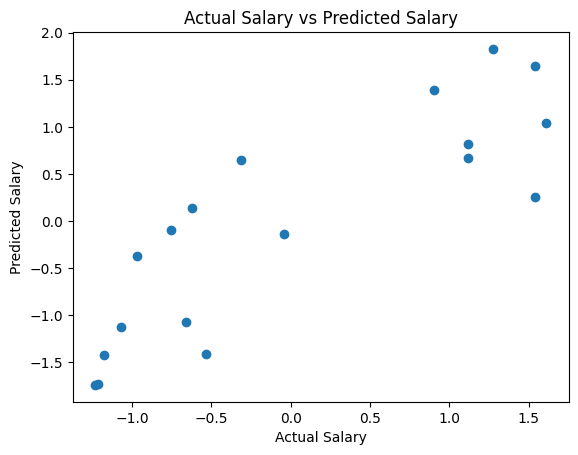

In [40]:
X = df_normalized[['PTS_pg', 'Age', 'threeP_pct', 'DWS', 'FT_pct', 'BLK_pct', 'FTA', 'FT', 'TOV_pct', 'GS', 'PTS', 'ORB', 'ORB_pct', 'STL', 'TRB', 'DRB', 'DBPM', 'OWS', 'WS', 'STL_pct', 'AST', 'USG_pct', 'WS_per_48', 'threePA', 'threeP',
                'FG', 'FG_pct', 'twoP_pct', 'MPG', 'G', 'MP', 'threePAr', 'twoPA', 'PER', 'OBPM', 'AST_pct', 'VORP', 'DRB_pct', 'TRB_pct', 'PF', 'FGA', 'BPM', 'TOV', 'TS_pct', 'twoP', 'FTr', 'BLK', 'PF_pg']]

y = df_normalized['salary_numeric']

from sklearn.model_selection import train_test_split

X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size=0.5, random_state=42)

from keras.models import Sequential
from keras.layers import Dense

# create the model
model = Sequential()

# add the layers
model.add(Dense(64, activation='relu', input_shape=(48,)))
model.add(Dense(64, activation='relu'))
model.add(Dense(1))

# compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# fit the model
history = model.fit(X_train, y_train, epochs=1000, batch_size=50, validation_data=(X_val, y_val), verbose=0)

train_loss = model.evaluate(X_train, y_train)
val_loss = model.evaluate(X_val, y_val)
test_loss = model.evaluate(X_test, y_test)

print("Training Loss: ", train_loss)
print("Validation Loss: ", val_loss)
print("Test Loss: ", test_loss)

y_pred = model.predict(X_test)


plt.plot(y_test, y_pred, 'o')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Actual Salary vs Predicted Salary')
plt.show()

From the Actual Salary vs Predicted Salary graph, it appears the model is ok at making predictions. The linear regression model might be the best fit for this set of data.

In [41]:
# make a table of the predicted salaries and the actual salaries
pred_df = pd.DataFrame({'Actual Salary': y_test, 'Predicted Salary': y_pred.flatten()})
pred_df['Difference'] = pred_df['Actual Salary'] - pred_df['Predicted Salary']
pred_df['Difference'] = pred_df['Difference'].abs()
pred_df['Difference'].mean()

pred_df

,Actual Salary,Predicted Salary,Difference
16,1.542606,1.644681,0.102075
90,-0.310871,0.652736,0.963608
168,-1.229670,-1.738184,0.508514
30,1.117718,0.820432,0.297286
15,1.542606,0.253022,1.289584
12,1.611592,1.038192,0.573400
145,-1.069716,-1.128673,0.058957
41,0.906753,1.390123,0.483370
114,-0.658633,-1.072109,0.413475
136,-0.968097,-0.373389,0.594708


It seems this model is decent at making predictions for player salary. However, overall the linear regression model still seems to be the best fit for the data.

In [42]:
# implement neural network model

from sklearn.neural_network import MLPRegressor

# create the model
nn_model = MLPRegressor(hidden_layer_sizes=(1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000), max_iter=100000)

# fit the model
nn_model.fit(X_train, y_train)

# get the predictions
y_pred = nn_model.predict(X_test)

# get the mean squared error
mean_squared_error(y_test, y_pred)

# get the R^2 value
nn_model.score(X_test, y_test)

0.39283924581335006

We make a table predicting all salaries of NBA players using the model.

In [43]:
# make a table predicing all players salaries

# get the players stats
players = df_normalized[predictors]

# predict the players salaries
predictions = nn_model.predict(players)

# make a table of the predicted salaries and the actual salaries
pred_df = pd.DataFrame({'Player': df_normalized['Player'], 'Predicted Salary': predictions})
pred_df['Actual Salary'] = df_normalized['salary_numeric']
pred_df['Difference'] = pred_df['Actual Salary'] - pred_df['Predicted Salary']

pred_df

,Player,Predicted Salary,Actual Salary,Difference
0,Stephen Curry,2.411921,2.398757,-0.013164
1,Russell Westbrook,2.392331,2.358922,-0.033409
2,LeBron James,2.149137,2.118274,-0.030863
3,Kevin Durant,2.126270,2.090566,-0.035704
4,Bradley Beal,2.060012,2.024983,-0.035029
...,...,...,...,...
167,Austin Reaves,-1.231861,-1.229670,0.002192
168,Ayo Dosunmu,-1.192013,-1.229670,-0.037657
169,RaiQuan Gray,-1.345240,-1.351655,-0.006415
170,Jeenathan Williams,-1.342655,-1.351655,-0.009000


From the table, we can see that the neural network model worked very well for predicting salaries of NBA players based on their stats. If we continued with further analysis, we could analyze data from other years and predict NBA salary and see how close we get to the actual salary.

## Conclusion

We can conclude that there is a strong correlation between player performance and salary. This makes sense as better players will typically get paid more than worse players. We can also conclude that there is a strong correlation between the various counting stats and salary. This also makes sense as players that get more points, rebounds, assists, etc. will typically get paid more than players that do not.

From the PCA section, we determined that the market values offensive contributions more than defensive contributions. This couldbe ddue to the nature of the league now where it seems like fans care more about points scored than the other aspects of basketball. It could also be a shift for teams trying to get better offensively than defensively. In any case, we were able to cluster players with similar stats to each other and determine that they mainly have similar salaries as well.

We combined the PCA with K-Means clustering to get highly accurate clustering of our players. We were then able to observe various trends position wise. For example, typical big men players like Bam Adebayo and Nic Claxton had a higher defensive contribution than offensive contribution. Additionally, guards typically did not have good defensive production but had good offensive contribution. The players to the top rights of the graph typically had higher salaries as they had better performance. Clearly, there is a strong correlation between player performance and salary.

We found a decent Linear Regression model (R^2=0.75) that was able to predict salaries of NBA players. We used the features that would be of most important to determining NBA salary.

Finally, we were able to feed our PCA data and other features into various ML models (RandomForestRegressor and NeuralNetworks) to try and predict NBA salaries from the various stats. The NeuralNetwork seemed to work better than the RandomForestRegressor. Later, we could use this NN to predict salaries of NBA players from other years.

Overall, we were able to succesfully determine there is a correlation between NBA player performance and salary. We determined some features are more important than others.